In [19]:
#1
print("start")

start


In [3]:
#2
import numpy as np
import pandas as pd
import cv2
import timm
import math
import time, os
from mapping import CLASS_MAP, NUM_SEG_CLASSES, NUM_CLASSES, IMG_SIZE, DATA_ROOT, INV_CLASS_MAP
import random

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.gridspec as gridspec
import matplotlib.patheffects as pe

from pathlib import Path


import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.ops import DeformConv2d
from torch.optim import AdamW
from torch.optim.lr_scheduler import CosineAnnealingLR
from torch.utils.data import DataLoader, Dataset



import albumentations as A
from albumentations.pytorch import ToTensorV2
from PIL import Image
from sklearn.cluster import KMeans
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report




In [4]:

#3
random.seed(42)

DATA_ROOT_PATH = Path("DATA")

CLASSES = [
    "Cheops", "LisaPathfinder", "ObservationSat1",
    "Proba2", "Proba3", "Proba3ocs",
    "Smart1", "Soho", "VenusExpress", "XMM Newton"
]

train_records, val_records, test_records = [], [], []

def make_record(img_path, orig_subfolder, cls):
    mask_name = img_path.name.replace("_img.", "_layer.")
    mask_path = DATA_ROOT_PATH / "mask" / cls / orig_subfolder / mask_name
    if not mask_path.exists():
        mask_path = DATA_ROOT_PATH / "mask" / cls / orig_subfolder / img_path.name
    return {
        "image_name": img_path.name,
        "mask_name":  mask_path.name if mask_path.exists() else "",
        "class":      cls,
        "subfolder":  orig_subfolder
    }

for cls in CLASSES:
    all_imgs = []
    for subfolder in ["train", "val", "test"]:
        folder = DATA_ROOT_PATH / "images" / cls / subfolder
        if folder.exists():
            imgs = sorted([f for f in folder.iterdir()
                           if f.suffix.lower() in (".jpg", ".jpeg", ".png")])
            all_imgs += [(f, subfolder) for f in imgs]

    random.shuffle(all_imgs)
    for img_path, sub in all_imgs[:40]:
        train_records.append(make_record(img_path, sub, cls))
    for img_path, sub in all_imgs[40:50]:
        val_records.append(make_record(img_path, sub, cls))
    for img_path, sub in all_imgs[50:60]:
        test_records.append(make_record(img_path, sub, cls))

pd.DataFrame(train_records).to_csv(DATA_ROOT_PATH / "train.csv", index=False)
pd.DataFrame(val_records).to_csv(  DATA_ROOT_PATH / "val.csv",   index=False)
pd.DataFrame(test_records).to_csv( DATA_ROOT_PATH / "test.csv",  index=False)

# verify
df = pd.read_csv(DATA_ROOT_PATH / "train.csv")
print("Columns:", df.columns.tolist())
print("Rows:", len(df))
print(df.head(2))

Columns: ['image_name', 'mask_name', 'class', 'subfolder']
Rows: 400
            image_name              mask_name   class subfolder
0  image_09304_img.jpg  image_09304_layer.jpg  Cheops     train
1  image_06488_img.jpg  image_06488_layer.jpg  Cheops     train


In [22]:
#4
DATA = Path("DATA")
rows = []

for cls_dir in sorted((DATA / "images").iterdir()):
    if not cls_dir.is_dir():
        continue
    cls = cls_dir.name
    train_dir = cls_dir / "train"
    if train_dir.exists():
        for img_path in sorted(train_dir.glob("*.jpg")):
            rows.append({
                "class": cls,
                "image_name": img_path.name,
                # mask column left blank — update if you have masks
                "mask_name": img_path.name.replace("_img.jpg", "_mask.jpg")
            })

df = pd.DataFrame(rows)
df.to_csv(DATA / "train.csv", index=False)
print(f"Total rows: {len(df)}")
print(df['class'].value_counts())
print(df.head())

Total rows: 400
class
Cheops             40
LisaPathfinder     40
ObservationSat1    40
Proba2             40
Proba3             40
Proba3ocs          40
Smart1             40
Soho               40
VenusExpress       40
XMM Newton         40
Name: count, dtype: int64
    class           image_name             mask_name
0  Cheops  image_00055_img.jpg  image_00055_mask.jpg
1  Cheops  image_00162_img.jpg  image_00162_mask.jpg
2  Cheops  image_00460_img.jpg  image_00460_mask.jpg
3  Cheops  image_00765_img.jpg  image_00765_mask.jpg
4  Cheops  image_00827_img.jpg  image_00827_mask.jpg


In [23]:
#5
rows = []
for cls_dir in sorted((DATA / "images").iterdir()):
    if not cls_dir.is_dir():
        continue
    cls = cls_dir.name
    train_dir = cls_dir / "train"
    if train_dir.exists():
        for img_path in sorted(train_dir.glob("*.jpg")):
            rows.append({
                "class": cls,
                "image_name": img_path.name,
                "mask_name": img_path.name.replace("_img.jpg", "_layer.jpg")
            })

df = pd.DataFrame(rows)
df.to_csv(DATA / "train.csv", index=False)
print(df.head())

    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg
3  Cheops  image_00765_img.jpg  image_00765_layer.jpg
4  Cheops  image_00827_img.jpg  image_00827_layer.jpg


Classes: {'Cheops': 40, 'LisaPathfinder': 40, 'ObservationSat1': 40, 'Proba2': 40, 'Proba3': 40, 'Proba3ocs': 40, 'Smart1': 40, 'Soho': 40, 'VenusExpress': 40, 'XMM Newton': 40}
Total rows: 400
    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg
3  Cheops  image_00765_img.jpg  image_00765_layer.jpg
4  Cheops  image_00827_img.jpg  image_00827_layer.jpg


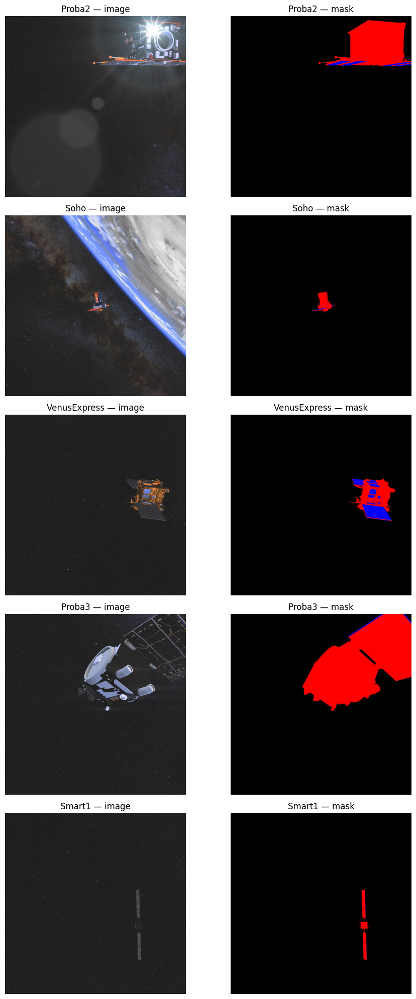

In [24]:
#6
DATA = Path("DATA")
df   = pd.read_csv(DATA / "train.csv")

print("Classes:", df['class'].value_counts().to_dict())
print("Total rows:", len(df))
print(df.head())

# Visual check — 5 random samples
samples = df.sample(5, random_state=0)
fig, axes = plt.subplots(5, 2, figsize=(10, 20))

for i, (_, row) in enumerate(samples.iterrows()):
    cls  = row['class']
    img  = Image.open(DATA / "images" / cls / "train" / row['image_name'])
    mask = Image.open(DATA / "mask"   / cls / "train" / row['mask_name'])
    
    axes[i,0].imshow(img);  axes[i,0].set_title(f"{cls} — image"); axes[i,0].axis('off')
    axes[i,1].imshow(mask); axes[i,1].set_title(f"{cls} — mask");  axes[i,1].axis('off')

plt.tight_layout()
plt.savefig("sample_check.png", dpi=150)
plt.show()

In [25]:
#7
train_df = pd.read_csv("DATA/train.csv")
print(train_df.columns.tolist())
print(train_df.head(3))

['class', 'image_name', 'mask_name']
    class           image_name              mask_name
0  Cheops  image_00055_img.jpg  image_00055_layer.jpg
1  Cheops  image_00162_img.jpg  image_00162_layer.jpg
2  Cheops  image_00460_img.jpg  image_00460_layer.jpg


In [26]:
#8
val_df = pd.read_csv("DATA/val.csv")
print(val_df.columns.tolist())
print(val_df.head(3))

['image_name', 'mask_name', 'class', 'subfolder']
            image_name              mask_name   class subfolder
0  image_03530_img.jpg  image_03530_layer.jpg  Cheops     train
1  image_07451_img.jpg  image_07451_layer.jpg  Cheops       val
2  image_04565_img.jpg  image_04565_layer.jpg  Cheops      test


In [ ]:
# 9
# 
# ── CELL 2: Palette + encode_mask ────────────────────────────────────────────
PALETTE = np.array([
    [0,   0,   0  ],   # 0 — background
    [255, 0,   0  ],   # 1 — component A (red)
    [0,   0,   255],   # 2 — component B (blue)
    [50,  2,   150],   # 3 — component C (purple)
    [190, 14,  50 ],   # 4 — component D (pink)
    [35,  0,   10 ],   # 5 — component E (dark)
], dtype=np.float32)

NUM_SEG_CLASSES = len(PALETTE)  # 6

def encode_mask(mask_bgr: np.ndarray) -> np.ndarray:
    mask_rgb = cv2.cvtColor(mask_bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    H, W, _  = mask_rgb.shape
    pixels   = mask_rgb.reshape(-1, 3)
    dists    = np.linalg.norm(pixels[:, None, :] - PALETTE[None, :, :], axis=-1)
    return np.argmin(dists, axis=-1).reshape(H, W).astype(np.int64)

In [ ]:
# 10 
def get_train_transforms():
    return A.Compose([
        A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_LINEAR),
        A.RandomBrightnessContrast(p=0.5),
        A.RandomGamma(p=0.3),
        A.GaussNoise(p=0.3),
        A.CoarseDropout(max_holes=8,
                        max_height=32,
                        max_width=32,
                        min_holes=1,
                        min_height=16,
                        min_width=16, p=0.3),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

def get_val_transforms():
    return A.Compose([
        A.Resize(IMG_SIZE, IMG_SIZE, interpolation=cv2.INTER_LINEAR),
        A.Normalize(mean=(0.485, 0.456, 0.406),
                    std=(0.229, 0.224, 0.225)),
        ToTensorV2(),
    ])

In [ ]:
#11
#  ── CELL 4: bbox helper ───────────────────────────────────────────────────────
def bbox_from_mask(mask_idx: np.ndarray):

    H, W = mask_idx.shape
    fg   = np.where(mask_idx > 0)
    if len(fg[0]) == 0:
        return [0.5, 0.5, 1.0, 1.0]       # fallback: full image
    y_min, y_max = int(fg[0].min()), int(fg[0].max())
    x_min, x_max = int(fg[1].min()), int(fg[1].max())
    cx = ((x_min + x_max) / 2) / W
    cy = ((y_min + y_max) / 2) / H
    w  = (x_max - x_min) / W
    h  = (y_max - y_min) / H
    return [cx, cy, w, h]

In [ ]:
# 12
# ── CELL 5: Dataset ───────────────────────────────────────────────────────────
class SparkDataset(Dataset):
  
    def __init__(self, csv_path, split='train'):
        assert split in ('train', 'val', 'test')
        self.split      = split
        self.df         = pd.read_csv(csv_path)
        self.transforms = (get_train_transforms() if split == 'train'
                           else get_val_transforms())

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
     row       = self.df.iloc[idx]
     cls_name  = row['class']
     cls_label = CLASS_MAP[cls_name]
     subfolder = row['subfolder']          # ← actual folder on disk

     img_path  = DATA_ROOT / 'images' / cls_name / subfolder / row['image_name']
     mask_path = DATA_ROOT / 'mask'   / cls_name / subfolder / row['mask_name']

     img_bgr  = cv2.imread(str(img_path))
     mask_bgr = cv2.imread(str(mask_path))
     assert img_bgr  is not None, f"Missing image: {img_path}"
     assert mask_bgr is not None, f"Missing mask:  {mask_path}"

     img_rgb  = cv2.cvtColor(img_bgr,  cv2.COLOR_BGR2RGB)
     mask_idx = encode_mask(mask_bgr)

     bbox_norm = bbox_from_mask(mask_idx)

     t        = self.transforms(image=img_rgb,
                               mask=mask_idx.astype(np.uint8))
     image    = t['image']
     mask_out = t['mask'].long()

     return (image,
            mask_out,
            torch.tensor(bbox_norm, dtype=torch.float32),
            torch.tensor(cls_label, dtype=torch.long))

In [ ]:
#13

train_ds = SparkDataset('DATA/train.csv', split='train')
val_ds  = SparkDataset('DATA/val.csv',   split='val')

train_loader = DataLoader(train_ds, batch_size=8, shuffle=True,  num_workers=0)
val_loader   = DataLoader(val_ds,   batch_size=8, shuffle=False, num_workers=0)

print(f"Train samples : {len(train_ds)}")
print(f"Val   samples : {len(val_ds)}")

images, masks, bboxes, labels = next(iter(train_loader))
print(f"\nBatch shapes:")
print(f"  images : {images.shape}  ")
print(f"  masks  : {masks.shape}    ")
print(f"  bboxes : {bboxes.shape}")
print(f"  labels : {labels.shape} " )
print(f"\nLabel values : {labels.tolist()}")
print(f"BBox sample  : {bboxes[0].tolist()}")
print(f"Mask unique  : {masks[0].unique().tolist()}")
print(f"Image min/max: {images[0].min():.3f} / {images[0].max():.3f}")

Train samples : 400
Val   samples : 100


KeyError: 'subfolder'

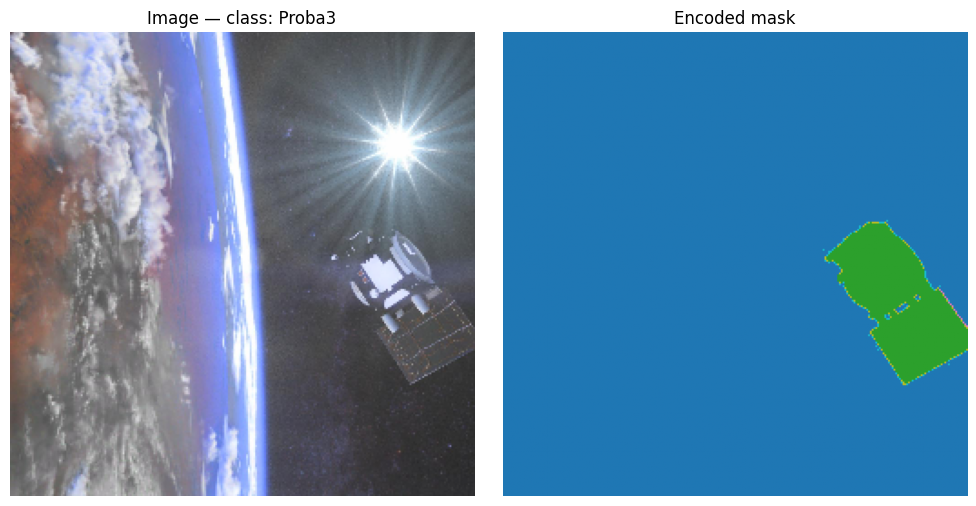

Saved: dataloader_check.png


In [ ]:

#14

img_show = images[0].permute(1, 2, 0).numpy()
# de-normalise for display
mean = np.array([0.485, 0.456, 0.406])
std  = np.array([0.229, 0.224, 0.225])
img_show = (img_show * std + mean).clip(0, 1)

fig, axes = plt.subplots(1, 2, figsize=(10, 5))
axes[0].imshow(img_show)
axes[0].set_title(f"Image — class: {INV_CLASS_MAP[labels[0].item()]}")
axes[0].axis('off')

axes[1].imshow(masks[0].numpy(), cmap='tab10', vmin=0, vmax=5)
axes[1].set_title("Encoded mask")
axes[1].axis('off')

plt.tight_layout()
plt.savefig("dataloader_check.png", dpi=100)
plt.show()
print("Saved: dataloader_check.png")

In [ ]:
#15
backbone = timm.create_model(
    'efficientvit_b1.r224_in1k',
    pretrained=False,
    features_only=True,
    out_indices=(0, 1, 2, 3)
)

x = torch.randn(2, 3, 256, 256)  
feats = backbone(x)
print("Backbone feature maps:")
for i, f in enumerate(feats):
    print(f"  feats[{i}]: shape={f.shape}  channels={f.shape[1]}")

Backbone feature maps:
  feats[0]: shape=torch.Size([2, 32, 64, 64])  channels=32
  feats[1]: shape=torch.Size([2, 64, 32, 32])  channels=64
  feats[2]: shape=torch.Size([2, 128, 16, 16])  channels=128
  feats[3]: shape=torch.Size([2, 256, 8, 8])  channels=256


In [ ]:
# 16
# ── CELL: Deformable FPN Neck ─────────────────────────────────────────────────


class DeformConvBlock(nn.Module):
   
    def __init__(self, in_ch, out_ch, kernel_size=3, padding=1):
        super().__init__()
        self.offset_conv = nn.Conv2d(
            in_ch,
            2 * kernel_size * kernel_size,
            kernel_size=kernel_size,
            padding=padding
        )
        self.deform_conv = DeformConv2d(
            in_ch, out_ch,
            kernel_size=kernel_size,
            padding=padding
        )
        self.bn   = nn.BatchNorm2d(out_ch)
        self.relu = nn.ReLU(inplace=True)

        nn.init.zeros_(self.offset_conv.weight)
        nn.init.zeros_(self.offset_conv.bias)

    def forward(self, x):
        offset = self.offset_conv(x)          # [B, 2*k*k, H, W]
        out    = self.deform_conv(x, offset)  # [B, out_ch, H, W]
        return self.relu(self.bn(out))


class DeformFPN(nn.Module):
    
    def __init__(self, in_channels=(64, 128, 256), out_ch=256):
        super().__init__()
        c2_in, c3_in, c4_in = in_channels

        # lateral connections (deformable)
        self.lat_c4 = DeformConvBlock(c4_in, out_ch)
        self.lat_c3 = DeformConvBlock(c3_in, out_ch)
        self.lat_c2 = DeformConvBlock(c2_in, out_ch)

        # output smoothing convs (deformable)
        self.out_p4 = DeformConvBlock(out_ch, out_ch)
        self.out_p3 = DeformConvBlock(out_ch, out_ch)
        self.out_p2 = DeformConvBlock(out_ch, out_ch)

    def forward(self, c2, c3, c4):
        # lateral projections
        l4 = self.lat_c4(c4)   # [B, 256, 16, 16]
        l3 = self.lat_c3(c3)   # [B, 256, 32, 32]
        l2 = self.lat_c2(c2)   # [B, 256, 64, 64]

        # top-down fusion
        p4 = l4
        p3 = l3 + F.interpolate(p4, size=l3.shape[-2:], mode='nearest')
        p2 = l2 + F.interpolate(p3, size=l2.shape[-2:], mode='nearest')

        # output smoothing
        p4 = self.out_p4(p4)
        p3 = self.out_p3(p3)
        p2 = self.out_p2(p2)

        return p2, p3, p4

In [ ]:
#17
neck = DeformFPN(in_channels=(64, 128, 256), out_ch=256)

c2 = torch.randn(2,  64, 32, 32)
c3 = torch.randn(2, 128, 16, 16)
c4 = torch.randn(2, 256,  8,  8)

p2, p3, p4 = neck(c2, c3, c4)

print("Neck output feature maps:")
print(f"  P2: {p2.shape}  ← expect [2, 256, 32, 32]")
print(f"  P3: {p3.shape}  ← expect [2, 256, 16, 16]")
print(f"  P4: {p4.shape}  ← expect [2, 256,  8,  8]")

total = sum(p.numel() for p in neck.parameters())
print(f"\nNeck params: {total/1e6:.2f}M")

Neck output feature maps:
  P2: torch.Size([2, 256, 32, 32])  ← expect [2, 256, 32, 32]
  P3: torch.Size([2, 256, 16, 16])  ← expect [2, 256, 16, 16]
  P4: torch.Size([2, 256, 8, 8])  ← expect [2, 256,  8,  8]

Neck params: 3.00M


In [ ]:

#18

class ClassificationHead(nn.Module):
   

    def __init__(
        self,
        in_channels: int = 256,
        hidden_dim: int  = 512,
        num_classes: int = NUM_CLASSES,
        dropout: float   = 0.3,
    ):
        super().__init__()

        self.gap = nn.AdaptiveAvgPool2d(1)          # [B, 256, 16, 16] → [B, 256, 1, 1]

        self.mlp = nn.Sequential(
            nn.Linear(in_channels, hidden_dim),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(hidden_dim, num_classes),     # raw logits — loss uses CrossEntropy
        )

        self._init_weights()

    # ── weight init ────────────────────────────────────────────────────────
    def _init_weights(self):
        for m in self.mlp.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                if m.bias is not None:
                    nn.init.zeros_(m.bias)

    # ── forward ────────────────────────────────────────────────────────────
    def forward(
        self,
        p4: torch.Tensor,                           # [B, 256, 16, 16]
        bridge_update: torch.Tensor | None = None,  # [B, 256]  — from CrossTaskBridge
    ) -> torch.Tensor:                              # [B, NUM_CLASSES]

        x = self.gap(p4).flatten(1)                 # [B, 256]

        if bridge_update is not None:
            # Additive update: bridge injects seg-derived evidence into cls
            assert bridge_update.shape == x.shape, (
                f"bridge_update shape {bridge_update.shape} != x shape {x.shape}"
            )
            x = x + bridge_update                   # [B, 256]

        logits = self.mlp(x)                        # [B, NUM_CLASSES]
        return logits

In [ ]:
#19
cls_head = ClassificationHead()
print(f"Cls head params: {sum(p.numel() for p in cls_head.parameters()):,}")

dummy_p4 = torch.randn(4, 256, 8, 8)   # ← 8×8 at 256 input

logits = cls_head(dummy_p4)
print(f"logits shape : {logits.shape}")   # expect [4, 10]
print(f"logits range : {logits.min():.3f} / {logits.max():.3f}")

probs = logits.softmax(dim=-1)
assert torch.allclose(probs.sum(dim=-1), torch.ones(4), atol=1e-5), "softmax broken"
print("✅ ClassificationHead sanity check passed")

Cls head params: 136,714
logits shape : torch.Size([4, 10])
logits range : -0.031 / 0.024
✅ ClassificationHead sanity check passed


In [ ]:
#20
#  ── Step 4 · FCOS Detection Head ────────────────────────────────────────────

class FCOSHead(nn.Module):
  

    def __init__(
        self,
        in_channels: int  = 256,
        num_classes: int  = NUM_CLASSES,   # 10
        tower_depth: int  = 4,             # conv layers before each branch head
        prior_prob: float = 0.01,          # focal-loss cls bias init
    ):
        super().__init__()

        # ── shared conv tower (cls branch) ──────────────────────────────────
        cls_tower = []
        for _ in range(tower_depth):
            cls_tower += [
                nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False),
                nn.GroupNorm(32, in_channels),
                nn.ReLU(inplace=True),
            ]
        self.cls_tower = nn.Sequential(*cls_tower)

        # ── shared conv tower (reg + centerness branch) ──────────────────────
        reg_tower = []
        for _ in range(tower_depth):
            reg_tower += [
                nn.Conv2d(in_channels, in_channels, 3, padding=1, bias=False),
                nn.GroupNorm(32, in_channels),
                nn.ReLU(inplace=True),
            ]
        self.reg_tower = nn.Sequential(*reg_tower)

        # ── output convs ────────────────────────────────────────────────────
        self.cls_logits  = nn.Conv2d(in_channels, num_classes, 1)   # 1×1
        self.bbox_pred   = nn.Conv2d(in_channels, 4, 1)             # (l,t,r,b)
        self.centerness  = nn.Conv2d(in_channels, 1, 1)

        self.scales = nn.ParameterList([
            nn.Parameter(torch.ones(1)) for _ in range(3)   # P2, P3, P4
        ])

        self._init_weights(prior_prob)

    # ── weight init ────────────────────────────────────────────────────────
    def _init_weights(self, prior_prob: float):
        # towers
        for m in list(self.cls_tower.modules()) + list(self.reg_tower.modules()):
            if isinstance(m, nn.Conv2d):
                nn.init.normal_(m.weight, std=0.01)

        # cls output: bias initialised so sigmoid(bias) ≈ prior_prob
        # suppresses massive loss at the start of training (focal loss trick)
        bias_value = -math.log((1 - prior_prob) / prior_prob)
        nn.init.constant_(self.cls_logits.bias, bias_value)
        nn.init.normal_(self.cls_logits.weight, std=0.01)

        # bbox + centerness output
        for layer in (self.bbox_pred, self.centerness):
            nn.init.normal_(layer.weight, std=0.01)
            nn.init.zeros_(layer.bias)

    # ── forward over all FPN levels ─────────────────────────────────────────
    def forward(
        self,
        features: list[torch.Tensor],   # [P2, P3, P4]  each [B, 256, H, W]
    ) -> tuple[list, list, list]:
        """
        Returns three lists, one entry per FPN level:
          cls_logits_list  : [[B, NUM_CLASSES, H2, W2], [B, …, H3, W3], …]
          bbox_preds_list  : [[B, 4, H2, W2], …]
          centerness_list  : [[B, 1, H2, W2], …]
        """
        cls_logits_list, bbox_preds_list, centerness_list = [], [], []

        for lvl, feat in enumerate(features):
            cls_feat = self.cls_tower(feat)
            reg_feat = self.reg_tower(feat)

            cls_logits_list.append(self.cls_logits(cls_feat))

            # exp(scale * raw) — always positive, no clamp needed during forward
            raw_box = self.bbox_pred(reg_feat)
            bbox_preds_list.append(torch.exp(self.scales[lvl] * raw_box))

            centerness_list.append(self.centerness(reg_feat))

        return cls_logits_list, bbox_preds_list, centerness_list

In [ ]:
#21
det_head = FCOSHead()
print(f"Det head params: {sum(p.numel() for p in det_head.parameters()):,}")

dummy_p2 = torch.randn(4, 256, 32, 32)
dummy_p3 = torch.randn(4, 256, 16, 16)
dummy_p4 = torch.randn(4, 256,  8,  8)

cls_list, box_list, ctr_list = det_head([dummy_p2, dummy_p3, dummy_p4])

for lvl, (cls, box, ctr) in enumerate(zip(cls_list, box_list, ctr_list)):
    H, W = cls.shape[-2], cls.shape[-1]
    print(f"  P{lvl+2} ({H}×{W})  cls:{list(cls.shape)}  box:{list(box.shape)}  ctr:{list(ctr.shape)}")
    assert cls.shape == (4, NUM_CLASSES, H, W)
    assert box.shape == (4, 4, H, W)
    assert ctr.shape == (4, 1, H, W)
    assert box.min() > 0, "bbox must be positive"

print("✅ FCOSHead sanity check passed")

Det head params: 4,726,546
  P2 (32×32)  cls:[4, 10, 32, 32]  box:[4, 4, 32, 32]  ctr:[4, 1, 32, 32]
  P3 (16×16)  cls:[4, 10, 16, 16]  box:[4, 4, 16, 16]  ctr:[4, 1, 16, 16]
  P4 (8×8)  cls:[4, 10, 8, 8]  box:[4, 4, 8, 8]  ctr:[4, 1, 8, 8]
✅ FCOSHead sanity check passed


In [ ]:
#22


class SegmentationHead(nn.Module):
  

    def __init__(
        self,
        in_channels:  int = 256,
        num_queries:  int = NUM_SEG_CLASSES,   # 6
        nhead:        int = 8,
        num_layers:   int = 3,
        ffn_dim:      int = 1024,
        dropout:      float = 0.1,
    ):
        super().__init__()

        self.num_queries = num_queries
        self.d_model     = in_channels         # 256

        # ── learnable component queries ─────────────────────────────────────
        self.query_embed = nn.Embedding(num_queries, in_channels)

        # ── 1×1 proj to normalise P2 features before attention ──────────────
        self.input_proj  = nn.Conv2d(in_channels, in_channels, 1)

        # ── transformer decoder ─────────────────────────────────────────────
        decoder_layer = nn.TransformerDecoderLayer(
            d_model=in_channels,
            nhead=nhead,
            dim_feedforward=ffn_dim,
            dropout=dropout,
            batch_first=True,       # [B, seq, C]  — matches our layout
            norm_first=True,        # pre-norm: more stable on small batches
        )
        self.decoder = nn.TransformerDecoder(
            decoder_layer=decoder_layer,
            num_layers=num_layers,
            norm=nn.LayerNorm(in_channels),
        )

        # ── mask projection: query → per-pixel dot product ──────────────────
        # A small MLP refines each query before the dot product
        self.mask_embed = nn.Sequential(
            nn.Linear(in_channels, in_channels),
            nn.ReLU(inplace=True),
            nn.Linear(in_channels, in_channels),
        )

        self._init_weights()

    # ── weight init ─────────────────────────────────────────────────────────
    def _init_weights(self):
        nn.init.trunc_normal_(self.query_embed.weight, std=0.02)
        for m in self.mask_embed.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                nn.init.zeros_(m.bias)
        nn.init.xavier_uniform_(self.input_proj.weight)
        nn.init.zeros_(self.input_proj.bias)

    # ── forward ─────────────────────────────────────────────────────────────
    def forward(
        self,
        p2: torch.Tensor,    # [B, 256, 64, 64]  — finest FPN level
    ) -> tuple[torch.Tensor, torch.Tensor]:

        B, C, H, W = p2.shape

        # 1. Project + flatten P2 into memory sequence
        mem = self.input_proj(p2)                        # [B, C, H, W]
        mem = mem.flatten(2).permute(0, 2, 1)            # [B, HW, C]  (HW=4096)

        # 2. Expand learnable queries over batch
        queries = self.query_embed.weight                # [Q, C]
        queries = queries.unsqueeze(0).expand(B, -1, -1) # [B, Q, C]

        # 3. Transformer decoder: queries attend to pixel memory
        queries_out = self.decoder(
            tgt=queries,    # [B, Q, C]
            memory=mem,     # [B, HW, C]
        )                   # [B, Q, C]

        # 4. Refine queries then dot-product with pixel features → masks
        q = self.mask_embed(queries_out)                 # [B, Q, C]
        px = self.input_proj(p2).flatten(2)              # [B, C, HW]
        mask_logits = torch.bmm(q, px)                  # [B, Q, HW]
        mask_logits = mask_logits.view(B, self.num_queries, H, W)  # [B, Q, H, W]

        return mask_logits, queries_out

In [ ]:
#23

seg_head = SegmentationHead()
print(f"Seg head params: {sum(p.numel() for p in seg_head.parameters()):,}")

dummy_p2 = torch.randn(4, 256, 32, 32)   # ← P2 is now 32×32

mask_logits, queries_out = seg_head(dummy_p2)

print(f"mask_logits : {list(mask_logits.shape)}")   # expect [4, 6, 32, 32]
print(f"queries_out : {list(queries_out.shape)}")   # expect [4, 6, 256]

assert mask_logits.shape == (4, NUM_SEG_CLASSES, 32, 32), "mask shape wrong"
assert queries_out.shape == (4, NUM_SEG_CLASSES, 256),    "query shape wrong"
assert torch.isfinite(mask_logits).all(), "NaN/Inf in mask logits"
assert torch.isfinite(queries_out).all(), "NaN/Inf in queries"

print("✅ SegmentationHead sanity check passed")

Seg head params: 3,359,744
mask_logits : [4, 6, 32, 32]
queries_out : [4, 6, 256]
✅ SegmentationHead sanity check passed


In [ ]:
#24
class CrossTaskBridge(nn.Module):

    def __init__(self, d_model=256, nhead=8, dropout=0.1):
        super().__init__()

        self.cross_attn = nn.MultiheadAttention(
            embed_dim=d_model, num_heads=nhead,
            dropout=dropout, batch_first=True,
        )
        self.ffn = nn.Sequential(
            nn.Linear(d_model, d_model * 2),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(d_model * 2, d_model),
        )

        # 3 norms for 3 normalization points (proper pre-norm)
        self.norm_q  = nn.LayerNorm(d_model)   # before Q projection
        self.norm_kv = nn.LayerNorm(d_model)   # before K/V projection
        self.norm_ff = nn.LayerNorm(d_model)   # before FFN

        self._init_weights()

    def _init_weights(self):
        for m in self.ffn.modules():
            if isinstance(m, nn.Linear):
                nn.init.trunc_normal_(m.weight, std=0.02)
                nn.init.zeros_(m.bias)

    def forward(self, gap_feat, queries_out):
        # gap_feat    : [B, 256]
        # queries_out : [B, 6, 256]

        q = gap_feat.unsqueeze(1)                  # [B, 1, 256]

        # ── cross-attention (pre-norm on all three inputs) ────────────────
        kv = self.norm_kv(queries_out)             # normalize key/value
        attn_out, attn_weights = self.cross_attn(
            query=self.norm_q(q),                  # normalize query
            key=kv,
            value=kv,
        )                                          # [B, 1, 256]

     
        delta = attn_out + self.ffn(self.norm_ff(attn_out))  # [B, 1, 256]

        return delta.squeeze(1), attn_weights      # [B, 256], [B, 1, 6]

In [ ]:
#25
bridge = CrossTaskBridge()
print(f"Bridge params: {sum(p.numel() for p in bridge.parameters()):,}")

dummy_p4      = torch.randn(4, 256, 8, 8)
dummy_queries = torch.randn(4, NUM_SEG_CLASSES, 256)

gap_feat      = nn.AdaptiveAvgPool2d(1)(dummy_p4).flatten(1)  # [4, 256]
bridge_update, attn_weights = bridge(gap_feat, dummy_queries)  # ← unpack tuple

print(f"bridge_update : {list(bridge_update.shape)}")   # expect [4, 256]
print(f"attn_weights  : {list(attn_weights.shape)}")    # expect [4, 1, 6]
assert bridge_update.shape == (4, 256)
assert torch.isfinite(bridge_update).all(), "NaN/Inf in bridge output"

cls_head       = ClassificationHead()
logits_bridged = cls_head(dummy_p4, bridge_update=bridge_update)
print(f"cls logits    : {list(logits_bridged.shape)}")  # expect [4, 10]
assert logits_bridged.shape == (4, NUM_CLASSES)

print("✅ CrossTaskBridge sanity check passed")

Bridge params: 527,616
bridge_update : [4, 256]
attn_weights  : [4, 1, 6]
cls logits    : [4, 10]
✅ CrossTaskBridge sanity check passed


In [ ]:
# 26
# ── Step 7 · SpaceMTViT Assembly ─────────────────────────────────────────────


class SpaceMTViT(nn.Module):
    

    def __init__(self, backbone, neck):
        super().__init__()
        self.backbone = backbone
        self.neck     = neck
        self.cls_head = ClassificationHead()
        self.det_head = FCOSHead()
        self.seg_head = SegmentationHead()
        self.bridge   = CrossTaskBridge()

    def forward(self, x: torch.Tensor) -> dict:
        # ── 1. Backbone ──────────────────────────────────────────────────────
        feats = self.backbone(x)             # out_indices=(0,1,2,3)
        c2, c3, c4 = feats[1], feats[2], feats[3]

        # ── 2. Neck ──────────────────────────────────────────────────────────
        p2, p3, p4 = self.neck(c2, c3, c4)  # [B,256,64,64/32,32/16,16]

        # ── 3. Segmentation head (runs first — provides queries for bridge) ──
        mask_logits, queries_out = self.seg_head(p2)
        # mask_logits : [B, 6, 64, 64]
        # queries_out : [B, 6, 256]

        # ── 4. Detection head ────────────────────────────────────────────────
        det_cls, det_box, det_ctr = self.det_head([p2, p3, p4])

        # ── 5. CrossTaskBridge → Classification head ─────────────────────────
        gap_feat      = self.cls_head.gap(p4).flatten(1)       # [B, 256]
        #bridge_update = self.bridge(gap_feat, queries_out)     # [B, 256]
        bridge_update, bridge_weights = self.bridge(gap_feat, queries_out)

        cls_logits    = self.cls_head(p4, bridge_update)       # [B, 10]

        return {
            # classification
            'cls_logits':  cls_logits,       # [B, 10]
            # detection — one entry per FPN level [P2, P3, P4]
            'det_cls':     det_cls,          # list of [B, 10, H, W]
            'det_box':     det_box,          # list of [B,  4, H, W]
            'det_ctr':     det_ctr,          # list of [B,  1, H, W]
            # segmentation
            'mask_logits': mask_logits,      # [B, 6, 64, 64]
            'queries_out': queries_out, 
            'bridge_weights': bridge_weights,
        }

In [ ]:
#27
#  ── Load best checkpoint (no retraining) ─────────────────────────────────────
ckpt = torch.load('checkpoints/best.pt', map_location='cpu')
model.load_state_dict(ckpt['model'])
model.eval()
print(f"Loaded epoch {ckpt['epoch']}  |  val_acc={ckpt['val_acc']:.4f}")

SEG_NAMES = ['background', 'comp-A', 'comp-B', 'comp-C', 'comp-D', 'comp-E']

fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Cross-Task Bridge: which component queries drive classification',
             fontsize=13, fontweight='bold')

seen, samples = set(), []
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 3:
                continue
            out = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':          images[i],
                    'label':          cls_idx,
                    'out':            out,
                })
                seen.add(cls_idx)
        if len(samples) == 3:
            break

for row, s in enumerate(samples):
    cls_name = INV_CLASS_MAP[s['label']]
    out      = s['out']

    # ── Panel 1: image ────────────────────────────────────────────────────
    img_np = (s['image'].permute(1,2,0).numpy() *
              np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])).clip(0,1)
    axes[row,0].imshow(img_np)
    axes[row,0].set_title(f'{cls_name}', fontweight='bold')
    axes[row,0].axis('off')

    # ── Panel 2: bridge attention weights ─────────────────────────────────
    # bridge_weights: [1, 1, 6] → squeeze to [6]
    weights = out['bridge_weights'][0, 0].numpy()   # [6]
    colors  = ['#aaaaaa' if i == 0 else '#4e79a7' for i in range(6)]
    bars = axes[row,1].bar(SEG_NAMES, weights, color=colors, edgecolor='white')
    axes[row,1].set_title('Bridge attention weights\n(which queries informed classification)')
    axes[row,1].set_ylim(0, weights.max() * 1.4)
    axes[row,1].tick_params(axis='x', rotation=30)
    for bar, w in zip(bars, weights):
        axes[row,1].text(bar.get_x() + bar.get_width()/2,
                         bar.get_height() + 0.002,
                         f'{w:.3f}', ha='center', va='bottom', fontsize=8)

    # ── Panel 3: segmentation mask (what the bridge was reading from) ─────
    mask_up   = F.interpolate(out['mask_logits'], size=(256,256),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()
    axes[row,2].imshow(img_np)
    axes[row,2].imshow(pred_mask, alpha=0.5, cmap='tab10', vmin=0, vmax=5)
    axes[row,2].set_title('Component mask\n(seg head output the bridge read)')
    axes[row,2].axis('off')

plt.tight_layout()
plt.savefig('bridge_attention_weights.png', dpi=150)
plt.show()
print("Saved → bridge_attention_weights.png")

In [ ]:
#28
model = SpaceMTViT(backbone, neck)

def count_params(module):
    return sum(p.numel() for p in module.parameters())

print("Parameter breakdown")
print(f"  Backbone : {count_params(model.backbone):>12,}")
print(f"  Neck     : {count_params(model.neck):>12,}")
print(f"  ClsHead  : {count_params(model.cls_head):>12,}")
print(f"  DetHead  : {count_params(model.det_head):>12,}")
print(f"  SegHead  : {count_params(model.seg_head):>12,}")
print(f"  Bridge   : {count_params(model.bridge):>12,}")
print(f"{'─'*28}")
print(f"  Total    : {count_params(model):>12,}")

model.eval()
dummy_img = torch.randn(4, 3, 256, 256)

with torch.no_grad():
    out = model(dummy_img)

assert out['cls_logits'].shape  == (4, NUM_CLASSES)
assert out['mask_logits'].shape == (4, NUM_SEG_CLASSES, 32, 32)

for lvl, (H, W) in enumerate([(32,32),(16,16),(8,8)]):
    assert out['det_cls'][lvl].shape == (4, NUM_CLASSES, H, W)
    assert out['det_box'][lvl].shape == (4, 4,           H, W)
    assert out['det_ctr'][lvl].shape == (4, 1,           H, W)
    assert out['det_box'][lvl].min() > 0

for key, val in out.items():
    if isinstance(val, torch.Tensor):
        assert torch.isfinite(val).all(), f"NaN/Inf in {key}"
    else:
        for t in val:
            assert torch.isfinite(t).all(), f"NaN/Inf in {key}"

print("\nOutput shapes")
print(f"  cls_logits  : {list(out['cls_logits'].shape)}")
print(f"  mask_logits : {list(out['mask_logits'].shape)}")
for lvl, H in enumerate([32, 16, 8]):
    print(f"  det P{lvl+2} ({H:2d}×{H:2d}) cls:{list(out['det_cls'][lvl].shape)}  box:{list(out['det_box'][lvl].shape)}  ctr:{list(out['det_ctr'][lvl].shape)}")

print("\n✅ SpaceMTViT full forward pass passed")

Parameter breakdown
  Backbone :    4,643,936
  Neck     :    3,003,372
  ClsHead  :      136,714
  DetHead  :    4,726,546
  SegHead  :    3,359,744
  Bridge   :      527,104
────────────────────────────
  Total    :   16,397,416

Output shapes
  cls_logits  : [4, 10]
  mask_logits : [4, 6, 32, 32]
  det P2 (32×32) cls:[4, 10, 32, 32]  box:[4, 4, 32, 32]  ctr:[4, 1, 32, 32]
  det P3 (16×16) cls:[4, 10, 16, 16]  box:[4, 4, 16, 16]  ctr:[4, 1, 16, 16]
  det P4 ( 8× 8) cls:[4, 10, 8, 8]  box:[4, 4, 8, 8]  ctr:[4, 1, 8, 8]

✅ SpaceMTViT full forward pass passed


In [ ]:
#30
def cls_loss_fn(cls_logits, labels):
   
    return F.cross_entropy(cls_logits, labels)


# ── 8.2  Detection loss — Focal + GIoU ───────────────────────────────────────
def focal_loss(pred, target, alpha=0.25, gamma=2.0):
   
    bce   = F.binary_cross_entropy_with_logits(pred, target, reduction='none')
    pt    = torch.exp(-bce)
    focal = alpha * (1 - pt) ** gamma * bce
    return focal.mean()


def giou_loss(pred_boxes, gt_boxes):
   
    # convert cx,cy,w,h → x1,y1,x2,y2
    def to_xyxy(b):
        return torch.stack([
            b[..., 0] - b[..., 2] / 2,
            b[..., 1] - b[..., 3] / 2,
            b[..., 0] + b[..., 2] / 2,
            b[..., 1] + b[..., 3] / 2,
        ], dim=-1)

    pb = to_xyxy(pred_boxes)
    gb = to_xyxy(gt_boxes)

    # intersection
    inter_x1 = torch.max(pb[..., 0], gb[..., 0])
    inter_y1 = torch.max(pb[..., 1], gb[..., 1])
    inter_x2 = torch.min(pb[..., 2], gb[..., 2])
    inter_y2 = torch.min(pb[..., 3], gb[..., 3])
    inter_w  = (inter_x2 - inter_x1).clamp(min=0)
    inter_h  = (inter_y2 - inter_y1).clamp(min=0)
    inter    = inter_w * inter_h

    # areas
    area_p  = (pb[..., 2] - pb[..., 0]) * (pb[..., 3] - pb[..., 1])
    area_g  = (gb[..., 2] - gb[..., 0]) * (gb[..., 3] - gb[..., 1])
    union   = area_p + area_g - inter

    iou     = inter / union.clamp(min=1e-6)

    # enclosing box
    enc_x1  = torch.min(pb[..., 0], gb[..., 0])
    enc_y1  = torch.min(pb[..., 1], gb[..., 1])
    enc_x2  = torch.max(pb[..., 2], gb[..., 2])
    enc_y2  = torch.max(pb[..., 3], gb[..., 3])
    enc     = (enc_x2 - enc_x1).clamp(min=0) * (enc_y2 - enc_y1).clamp(min=0)

    giou    = iou - (enc - union) / enc.clamp(min=1e-6)
    return (1 - giou).mean()


def det_loss_fn(det_cls, det_box, det_ctr, gt_boxes, gt_labels):
    # Use P3 (level index 1) — 32×32 grid
    cls_map = det_cls[1]   # [B, C, 32, 32]
    box_map = det_box[1]   # [B, 4, 32, 32]  — values are exp-activated distances
    ctr_map = det_ctr[1]   # [B, 1, 32, 32]

    B, C, H, W = cls_map.shape
    stride = IMG_SIZE / H  # e.g. 256/32 = 8

    # ── build per-cell (l,t,r,b) targets from the GT [cx,cy,w,h] box ────────
    # Convert normalized GT box → absolute pixels
    gt_cx = gt_boxes[:, 0] * IMG_SIZE   # [B]
    gt_cy = gt_boxes[:, 1] * IMG_SIZE
    gt_w  = gt_boxes[:, 2] * IMG_SIZE
    gt_h  = gt_boxes[:, 3] * IMG_SIZE

    gt_x1 = gt_cx - gt_w / 2            # [B]
    gt_y1 = gt_cy - gt_h / 2
    gt_x2 = gt_cx + gt_w / 2
    gt_y2 = gt_cy + gt_h / 2

    # Grid cell centres: [H, W]
    ys = (torch.arange(H, dtype=torch.float32) + 0.5) * stride   # [H]
    xs = (torch.arange(W, dtype=torch.float32) + 0.5) * stride   # [W]
    grid_y, grid_x = torch.meshgrid(ys, xs, indexing='ij')        # [H, W]

    # For every cell (gy, gx) and every image b, compute l,t,r,b in pixels
    # shape: [B, 4, H, W]
    l_tgt = (grid_x.unsqueeze(0) - gt_x1.view(B,1,1)).clamp(min=0)
    t_tgt = (grid_y.unsqueeze(0) - gt_y1.view(B,1,1)).clamp(min=0)
    r_tgt = (gt_x2.view(B,1,1) - grid_x.unsqueeze(0)).clamp(min=0)
    b_tgt = (gt_y2.view(B,1,1) - grid_y.unsqueeze(0)).clamp(min=0)
    ltrb_tgt = torch.stack([l_tgt, t_tgt, r_tgt, b_tgt], dim=1)  # [B, 4, H, W]

    # ── centerness target: sqrt((min(l,r)/max(l,r)) * (min(t,b)/max(t,b))) ──
    lr = torch.stack([l_tgt, r_tgt], dim=1)
    tb = torch.stack([t_tgt, b_tgt], dim=1)
    ctr_tgt = torch.sqrt(
        (lr.min(dim=1).values / lr.max(dim=1).values.clamp(min=1e-6)) *
        (tb.min(dim=1).values / tb.max(dim=1).values.clamp(min=1e-6))
    ).unsqueeze(1)  # [B, 1, H, W]

    # ── cls loss (focal) ─────────────────────────────────────────────────────
    cls_target = torch.zeros(B, C, H, W)
    for b in range(B):
        cls_target[b, gt_labels[b]] = 1.0
    l_cls = focal_loss(
        cls_map.permute(0,2,3,1).reshape(-1, C),
        cls_target.permute(0,2,3,1).reshape(-1, C),
    )

    # ── box regression loss (GIoU on absolute pixel coords) ──────────────────
    # Convert both pred and target from (l,t,r,b) → (x1,y1,x2,y2) using cell centres
    def ltrb_to_xyxy(ltrb):
        # ltrb: [B, 4, H, W] → [B*H*W, 4]
        flat = ltrb.permute(0,2,3,1).reshape(-1, 4)
        cx_  = grid_x.reshape(-1).repeat(B)
        cy_  = grid_y.reshape(-1).repeat(B)
        x1   = cx_ - flat[:, 0]
        y1   = cy_ - flat[:, 1]
        x2   = cx_ + flat[:, 2]
        y2   = cy_ + flat[:, 3]
        return torch.stack([x1, y1, x2, y2], dim=-1)

    pred_xyxy = ltrb_to_xyxy(box_map)
    tgt_xyxy  = ltrb_to_xyxy(ltrb_tgt)
    l_box = F.l1_loss(pred_xyxy, tgt_xyxy)   # L1 is more stable early on than GIoU

    # ── centerness loss (BCE) ─────────────────────────────────────────────────
    l_ctr = F.binary_cross_entropy_with_logits(ctr_map, ctr_tgt)

    return l_cls + l_box + 0.5 * l_ctr


# ── 8.3  Segmentation loss — BCE + Dice ──────────────────────────────────────
def seg_loss_fn(mask_logits, masks_gt):
    """
    mask_logits : [B, 6, H, W]   raw logits — H,W now dynamic (32×32 at 256 input)
    masks_gt    : [B, 512, 512]  int64 class indices
    """
    # 1. downsample GT to match logit resolution dynamically
    H, W = mask_logits.shape[2], mask_logits.shape[3]   # ← no longer hardcoded 64
    masks_small = F.interpolate(
        masks_gt.unsqueeze(1).float(),
        size=(H, W),
        mode='nearest'
    ).squeeze(1).long()                                  # [B, H, W]

    # 2. one-hot → [B, 6, H, W]
    B = masks_small.shape[0]
    one_hot = torch.zeros(B, NUM_SEG_CLASSES, H, W)
    one_hot.scatter_(1, masks_small.unsqueeze(1), 1.0)

    # 3. class weights — upweight rare minority classes
    seg_weights = torch.tensor(
        [0.5, 1.0, 1.0, 5.0, 5.0, 5.0]
    ).view(1, NUM_SEG_CLASSES, 1, 1)                     # [1, 6, 1, 1]

    # 3a. weighted BCE
    l_bce = F.binary_cross_entropy_with_logits(
        mask_logits,
        one_hot,
        pos_weight=seg_weights                           # ← NEW
    )

    # 3b. weighted Dice — manually weight per class
    probs      = torch.sigmoid(mask_logits)
    num        = 2 * (probs * one_hot).sum(dim=(2, 3))           # [B, 6]
    den        = (probs + one_hot).sum(dim=(2, 3)).clamp(1e-6)   # [B, 6]
    dice       = 1 - (num / den)                                 # [B, 6]

    class_w    = torch.tensor([0.5, 1.0, 1.0, 5.0, 5.0, 5.0])   # [6]
    l_dice     = (dice * class_w).mean()                         # ← weighted Dice

    return l_bce + l_dice

In [ ]:
# 31
# ── 8.4  Homoscedastic uncertainty weighting ─────────────────────────────────
class MultiTaskLoss(nn.Module):
    """
    Kendall et al. (2018) uncertainty weighting:
        L = Σ  (1/2σ²_i) * L_i  +  log σ_i

    log_sigma is learned — σ grows to down-weight a task that is harder
    to fit, automatically balancing the three losses without manual tuning.

    This is the paper's second novelty claim after the CrossTaskBridge.
    """

    def __init__(self):
        super().__init__()
        # initialise log(σ) = 0  →  σ = 1  →  equal weights at start
        self.log_sigma_cls = nn.Parameter(torch.zeros(1))
        self.log_sigma_det = nn.Parameter(torch.zeros(1))
        self.log_sigma_seg = nn.Parameter(torch.zeros(1))

    def forward(self, out, labels, gt_boxes, masks_gt):
    
        l_cls = cls_loss_fn(out['cls_logits'], labels)
        l_det = det_loss_fn(out['det_cls'], out['det_box'], out['det_ctr'],
                            gt_boxes, labels)
        l_seg = seg_loss_fn(out['mask_logits'], masks_gt)

        # uncertainty-weighted combination
        w_cls = torch.exp(-2 * self.log_sigma_cls)
        w_det = torch.exp(-2 * self.log_sigma_det)
        w_seg = torch.exp(-2 * self.log_sigma_seg)

        loss = (w_cls * l_cls + self.log_sigma_cls +
                w_det * l_det + self.log_sigma_det +
                w_seg * l_seg + self.log_sigma_seg)

        gap_feat                      = self.cls_head.gap(p4).flatten(1)
        bridge_delta, bridge_weights  = self.bridge(gap_feat, queries_out)
        cls_logits                    = self.cls_head(p4, bridge_delta)

        return {
    'cls_logits':      cls_logits,
    'det_cls':         det_cls,
    'det_box':         det_box,
    'det_ctr':         det_ctr,
    'mask_logits':     mask_logits,
    'queries_out':     queries_out,
    'bridge_weights':  bridge_weights,   # [B, 1, 6] — expose for visualization
}

In [ ]:
#32
criterion = MultiTaskLoss()
print(f"Loss params (log_sigmas): {sum(p.numel() for p in criterion.parameters())}")

model.eval()
dummy_img    = torch.randn(4, 3, 256, 256)
dummy_labels = torch.randint(0, NUM_CLASSES, (4,))
dummy_boxes  = torch.rand(4, 4).clamp(0.1, 0.9)
dummy_masks  = torch.randint(0, NUM_SEG_CLASSES, (4, 256, 256))

with torch.no_grad():
    out = model(dummy_img)

loss, loss_dict = criterion(out, dummy_labels, dummy_boxes, dummy_masks)

print(f"\nTotal loss : {loss.item():.4f}")
for k, v in loss_dict.items():
    print(f"  {k:<12}: {v:.4f}")

assert torch.isfinite(loss)
assert loss.item() > 0
print("\n✅ MultiTaskLoss sanity check passed")

Loss params (log_sigmas): 3

Total loss : 7.4788
  loss_cls    : 2.3014
  loss_det    : 2.0674
  loss_seg    : 3.1100
  w_cls       : 1.0000
  w_det       : 1.0000
  w_seg       : 1.0000

✅ MultiTaskLoss sanity check passed


In [ ]:
#33
assert 'SparkDataset'  in globals(), "Rerun dataset cells first"
assert 'SpaceMTViT'    in globals(), "Rerun model cells first"
assert 'criterion'     in globals(), "Rerun loss cells first"

backbone_pretrained = timm.create_model(
    'efficientvit_b1.r224_in1k',
    pretrained=True,
    features_only=True,
    out_indices=(0, 1, 2, 3)
)
model = SpaceMTViT(backbone_pretrained, neck)
model.train()

EPOCHS       = 25
LR           = 1e-4
WEIGHT_DECAY = 1e-4
GRAD_CLIP    = 1.0
BATCH_SIZE   = 8

optimizer = AdamW([
    {'params': model.backbone.parameters(), 'lr': LR * 0.1},
    {'params': list(model.neck.parameters())
             + list(model.cls_head.parameters())
             + list(model.det_head.parameters())
             + list(model.seg_head.parameters())
             + list(model.bridge.parameters()),
     'lr': LR},
    {'params': criterion.parameters(), 'lr': LR},
], weight_decay=WEIGHT_DECAY)

scheduler = CosineAnnealingLR(optimizer, T_max=EPOCHS, eta_min=1e-6)

train_dataset = SparkDataset(csv_path='DATA/train.csv', split='train')
val_dataset   = SparkDataset(csv_path='DATA/val.csv',   split='val')

train_loader  = DataLoader(train_dataset, batch_size=BATCH_SIZE,
                           shuffle=True,  num_workers=0, pin_memory=False)
val_loader    = DataLoader(val_dataset,   batch_size=BATCH_SIZE,
                           shuffle=False, num_workers=0, pin_memory=False)

print(f"Train batches : {len(train_loader)}")
print(f"Val batches   : {len(val_loader)}")
print(f"Total params  : {sum(p.numel() for p in model.parameters()):,}")

Train batches : 50
Val batches   : 13
Total params  : 16,397,416


In [ ]:
# 34
# ── validation pass ───────────────────────────────────────────────────────────
def validate(model, criterion, val_loader):
    model.eval()
    total_loss = 0.0
    correct    = 0
    total      = 0

    with torch.no_grad():
        for images, masks_gt, bboxes, labels in val_loader:
            out = model(images)
            loss, _ = criterion(out, labels, bboxes, masks_gt)
            total_loss += loss.item()

            preds    = out['cls_logits'].argmax(dim=1)
            correct += (preds == labels).sum().item()
            total   += labels.size(0)

    avg_loss = total_loss / len(val_loader)
    acc      = correct / total
    return avg_loss, acc

In [ ]:
#35
#  ── training loop ─────────────────────────────────────────────────────────────
CKPT_DIR  = 'checkpoints'
os.makedirs(CKPT_DIR, exist_ok=True)

best_val_loss = float('inf')
history = {
    'train_loss': [], 'val_loss': [],
    'val_acc':    [],
    'w_cls': [], 'w_det': [], 'w_seg': [],
    'lr': [],
}

print(f"{'Ep':>4}  {'Train':>8}  {'Val':>8}  {'Acc':>7}  "
      f"{'w_cls':>6}  {'w_det':>6}  {'w_seg':>6}  {'Time':>6}")
print("─" * 72)

for epoch in range(1, EPOCHS + 1):
    model.train()
    t0         = time.time()
    epoch_loss = 0.0
    epoch_wts  = {'w_cls': 0., 'w_det': 0., 'w_seg': 0.}

    for batch_idx, (images, masks_gt, bboxes, labels) in enumerate(train_loader):
        optimizer.zero_grad()
        out             = model(images)
        loss, loss_dict = criterion(out, labels, bboxes, masks_gt)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            list(model.parameters()) + list(criterion.parameters()),
            GRAD_CLIP
        )
        optimizer.step()

        epoch_loss += loss.item()
        for k in epoch_wts:
            epoch_wts[k] += loss_dict[k]

        if (batch_idx + 1) % 10 == 0:
            print(f"  Ep {epoch} | batch {batch_idx+1:>3}/100 | "
                  f"loss {loss.item():.4f} | "
                  f"{time.time()-t0:.0f}s elapsed", flush=True)

    scheduler.step()

    n          = len(train_loader)
    train_loss = epoch_loss / n
    val_loss, val_acc = validate(model, criterion, val_loader)
    current_lr = scheduler.get_last_lr()[0]

    history['train_loss'].append(train_loss)
    history['val_loss'].append(val_loss)
    history['val_acc'].append(val_acc)
    history['lr'].append(current_lr)
    for k in epoch_wts:
        history[k].append(epoch_wts[k] / n)

    if val_loss < best_val_loss:
        best_val_loss = val_loss
        torch.save({
            'epoch':     epoch,
            'model':     model.state_dict(),
            'criterion': criterion.state_dict(),
            'optimizer': optimizer.state_dict(),
            'scheduler': scheduler.state_dict(),
            'val_loss':  val_loss,
            'val_acc':   val_acc,
        }, os.path.join(CKPT_DIR, 'best.pt'))
        tag = ' ◄ best'
    else:
        tag = ''

    print(f"{epoch:>4}  {train_loss:>8.4f}  {val_loss:>8.4f}  "
          f"{val_acc:>7.4f}  "
          f"{epoch_wts['w_cls']/n:>6.3f}  "
          f"{epoch_wts['w_det']/n:>6.3f}  "
          f"{epoch_wts['w_seg']/n:>6.3f}  "
          f"{time.time()-t0:>5.1f}s{tag}", flush=True)

print("\nTraining complete.")
print(f"Best val loss : {best_val_loss:.4f}")
print(f"Checkpoint    : {CKPT_DIR}/best.pt")

  Ep     Train       Val      Acc   w_cls   w_det   w_seg    Time
────────────────────────────────────────────────────────────────────────
  Ep 1 | batch  10/100 | loss 6.7841 | 125s elapsed
  Ep 1 | batch  20/100 | loss 6.1945 | 264s elapsed
  Ep 1 | batch  30/100 | loss 6.0965 | 354s elapsed
  Ep 1 | batch  40/100 | loss 5.8046 | 441s elapsed
  Ep 1 | batch  50/100 | loss 5.9321 | 568s elapsed
   1    6.3145    5.6497   0.5000   0.995   0.995   0.995  631.5s ◄ best
  Ep 2 | batch  10/100 | loss 5.5909 | 120s elapsed
  Ep 2 | batch  20/100 | loss 5.5128 | 237s elapsed
  Ep 2 | batch  30/100 | loss 5.1108 | 358s elapsed
  Ep 2 | batch  40/100 | loss 5.2851 | 497s elapsed
  Ep 2 | batch  50/100 | loss 4.8462 | 613s elapsed
   2    5.3228    4.6210   0.7100   0.987   0.988   0.987  670.5s ◄ best
  Ep 3 | batch  10/100 | loss 4.5195 | 100s elapsed
  Ep 3 | batch  20/100 | loss 4.2150 | 249s elapsed
  Ep 3 | batch  30/100 | loss 4.1298 | 411s elapsed
  Ep 3 | batch  40/100 | loss 4.1270 | 

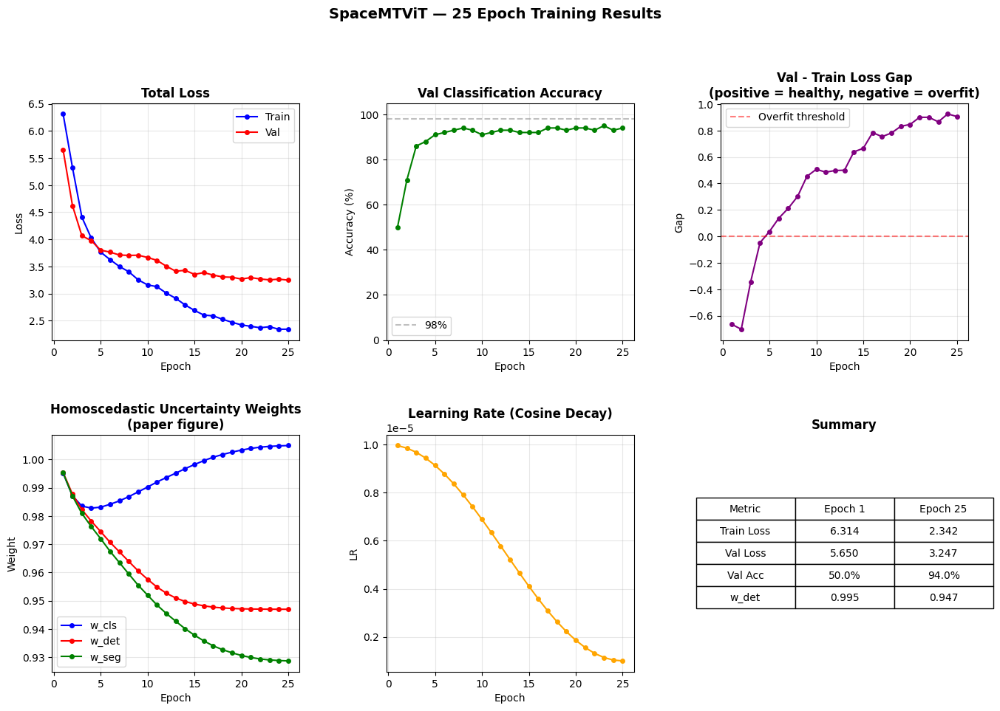

Saved → training_curves.png


In [ ]:
# 36
# ── Step 10a · Training curves ───────────────────────────────────────────────

epochs_range = range(1, len(history['train_loss']) + 1)

fig = plt.figure(figsize=(16, 10))
gs  = gridspec.GridSpec(2, 3, figure=fig, hspace=0.4, wspace=0.35)

# ── 1. Loss curves ────────────────────────────────────────────────────────────
ax1 = fig.add_subplot(gs[0, 0])
ax1.plot(epochs_range, history['train_loss'], 'b-o', markersize=4, label='Train')
ax1.plot(epochs_range, history['val_loss'],   'r-o', markersize=4, label='Val')
ax1.set_title('Total Loss', fontweight='bold')
ax1.set_xlabel('Epoch')
ax1.set_ylabel('Loss')
ax1.legend()
ax1.grid(True, alpha=0.3)

# ── 2. Accuracy ───────────────────────────────────────────────────────────────
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(epochs_range, [a * 100 for a in history['val_acc']],
         'g-o', markersize=4)
ax2.axhline(y=98, color='gray', linestyle='--', alpha=0.5, label='98%')
ax2.set_title('Val Classification Accuracy', fontweight='bold')
ax2.set_xlabel('Epoch')
ax2.set_ylabel('Accuracy (%)')
ax2.set_ylim(0, 105)
ax2.legend()
ax2.grid(True, alpha=0.3)

# ── 3. Overfitting gap ────────────────────────────────────────────────────────
ax3 = fig.add_subplot(gs[0, 2])
gap = [v - t for t, v in zip(history['train_loss'], history['val_loss'])]
ax3.plot(epochs_range, gap, 'purple', marker='o', markersize=4)
ax3.axhline(y=0, color='red', linestyle='--', alpha=0.5, label='Overfit threshold')
ax3.set_title('Val - Train Loss Gap\n(positive = healthy, negative = overfit)',
              fontweight='bold')
ax3.set_xlabel('Epoch')
ax3.set_ylabel('Gap')
ax3.legend()
ax3.grid(True, alpha=0.3)

# ── 4. Uncertainty weights ────────────────────────────────────────────────────
ax4 = fig.add_subplot(gs[1, 0])
ax4.plot(epochs_range, history['w_cls'], 'b-o', markersize=4, label='w_cls')
ax4.plot(epochs_range, history['w_det'], 'r-o', markersize=4, label='w_det')
ax4.plot(epochs_range, history['w_seg'], 'g-o', markersize=4, label='w_seg')
ax4.set_title('Homoscedastic Uncertainty Weights\n(paper figure)', fontweight='bold')
ax4.set_xlabel('Epoch')
ax4.set_ylabel('Weight')
ax4.legend()
ax4.grid(True, alpha=0.3)

# ── 5. Learning rate schedule ─────────────────────────────────────────────────
ax5 = fig.add_subplot(gs[1, 1])
ax5.plot(epochs_range, history['lr'], 'orange', marker='o', markersize=4)
ax5.set_title('Learning Rate (Cosine Decay)', fontweight='bold')
ax5.set_xlabel('Epoch')
ax5.set_ylabel('LR')
ax5.ticklabel_format(style='sci', axis='y', scilimits=(0,0))
ax5.grid(True, alpha=0.3)

# ── 6. Loss gap table summary ─────────────────────────────────────────────────
ax6 = fig.add_subplot(gs[1, 2])
ax6.axis('off')
table_data = [
    ['Metric', 'Epoch 1', 'Epoch 25'],
    ['Train Loss', f"{history['train_loss'][0]:.3f}",
                   f"{history['train_loss'][-1]:.3f}"],
    ['Val Loss',   f"{history['val_loss'][0]:.3f}",
                   f"{history['val_loss'][-1]:.3f}"],
    ['Val Acc',    f"{history['val_acc'][0]*100:.1f}%",
                   f"{history['val_acc'][-1]*100:.1f}%"],
    ['w_det',      f"{history['w_det'][0]:.3f}",
                   f"{history['w_det'][-1]:.3f}"],
]
tbl = ax6.table(cellText=table_data[1:], colLabels=table_data[0],
                loc='center', cellLoc='center')
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.8)
ax6.set_title('Summary', fontweight='bold')

plt.suptitle('SpaceMTViT — 25 Epoch Training Results', fontsize=14,
             fontweight='bold', y=1.01)
plt.savefig('training_curves.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → training_curves.png")

Detection Evaluation — Test Set (100 images)

  Mean IoU (pred vs GT box)  : 0.0348
  Median IoU                 : 0.0274
  IoU > 0.50                 : 0/100 images
  IoU > 0.75                 : 0/100 images
  IoU > 0.25                 : 0/100 images

  IoU@0.5  —  Precision 0.0000  Recall 0.0000  F1 0.0000
  IoU@0.75  —  Precision 0.0000  Recall 0.0000  F1 0.0000



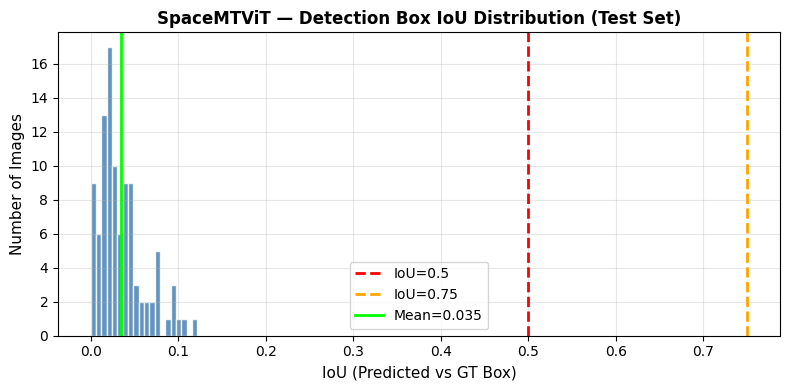

Saved → detection_iou.png


In [ ]:
# 37
# ── Detection evaluation — mAP@0.5 ──────────────────────────────────────────
test_dataset = SparkDataset(csv_path='DATA/test.csv', split='test')
test_loader  = DataLoader(test_dataset, batch_size=1,
                          shuffle=False, num_workers=0)

def box_iou(box1, box2):
    """
    box1, box2 : [N, 4] in x1y1x2y2 pixels
    returns IoU [N]
    """
    x1 = torch.max(box1[:, 0], box2[:, 0])
    y1 = torch.max(box1[:, 1], box2[:, 1])
    x2 = torch.min(box1[:, 2], box2[:, 2])
    y2 = torch.min(box1[:, 3], box2[:, 3])

    inter = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    area1 = (box1[:, 2] - box1[:, 0]) * (box1[:, 3] - box1[:, 1])
    area2 = (box2[:, 2] - box2[:, 0]) * (box2[:, 3] - box2[:, 1])
    return inter / (area1 + area2 - inter).clamp(1e-6)


def cx_cy_wh_to_xyxy(box, img_size=IMG_SIZE):
    cx, cy, w, h = box[0], box[1], box[2], box[3]
    x1 = (cx - w/2) * img_size
    y1 = (cy - h/2) * img_size
    x2 = (cx + w/2) * img_size
    y2 = (cy + h/2) * img_size
    return torch.tensor([[x1, y1, x2, y2]])

def get_pred_box_xyxy(det_box, det_ctr, img_size=IMG_SIZE):
    H, W   = det_ctr.shape[1], det_ctr.shape[2]
    stride = img_size / H

    flat   = det_ctr[0].reshape(-1).argmax().item()
    gy, gx = flat // W, flat % W
    px = (gx + 0.5) * stride
    py = (gy + 0.5) * stride

    l = det_box[0, gy, gx].item() * stride
    t = det_box[1, gy, gx].item() * stride
    r = det_box[2, gy, gx].item() * stride
    b = det_box[3, gy, gx].item() * stride

    x1 = max(0, px - l)
    y1 = max(0, py - t)
    x2 = min(img_size, px + r)
    y2 = min(img_size, py + b)
    return torch.tensor([[x1, y1, x2, y2]])


# ── run over full test set ───────────────────────────────────────────────────
model.eval()
iou_thresholds = [0.5, 0.75]
results = {t: {'tp': 0, 'fp': 0, 'fn': 0} for t in iou_thresholds}
all_ious = []

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        out = model(images)

        for i in range(images.size(0)):
            # GT box
            gt_xyxy   = cx_cy_wh_to_xyxy(bboxes_gt[i])

            # predicted box from P3 centerness peak
            pred_xyxy = get_pred_box_xyxy(
                out['det_box'][1][i],
                out['det_ctr'][1][i]
            )

            iou = box_iou(pred_xyxy, gt_xyxy).item()
            all_ious.append(iou)

            for thresh in iou_thresholds:
                if iou >= thresh:
                    results[thresh]['tp'] += 1
                else:
                    results[thresh]['fp'] += 1
                    results[thresh]['fn'] += 1

# ── print results ────────────────────────────────────────────────────────────
print("Detection Evaluation — Test Set (100 images)")
print()
print(f"  Mean IoU (pred vs GT box)  : {np.mean(all_ious):.4f}")
print(f"  Median IoU                 : {np.median(all_ious):.4f}")
print(f"  IoU > 0.50                 : "
      f"{sum(i >= 0.5  for i in all_ious)}/100 images")
print(f"  IoU > 0.75                 : "
      f"{sum(i >= 0.75 for i in all_ious)}/100 images")
print(f"  IoU > 0.25                 : "
      f"{sum(i >= 0.25 for i in all_ious)}/100 images")
print()

for thresh in iou_thresholds:
    tp = results[thresh]['tp']
    fp = results[thresh]['fp']
    prec   = tp / (tp + fp) if (tp + fp) > 0 else 0
    recall = tp / 100
    f1     = 2 * prec * recall / (prec + recall) if (prec + recall) > 0 else 0
    print(f"  IoU@{thresh}  —  "
          f"Precision {prec:.4f}  "
          f"Recall {recall:.4f}  "
          f"F1 {f1:.4f}")

print()

# ── IoU distribution histogram ───────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(all_ious, bins=20, color='steelblue', edgecolor='white', alpha=0.85)
ax.axvline(x=0.5,  color='red',    linestyle='--', linewidth=2, label='IoU=0.5')
ax.axvline(x=0.75, color='orange', linestyle='--', linewidth=2, label='IoU=0.75')
ax.axvline(x=np.mean(all_ious), color='lime', linestyle='-',
           linewidth=2, label=f'Mean={np.mean(all_ious):.3f}')
ax.set_xlabel('IoU (Predicted vs GT Box)', fontsize=11)
ax.set_ylabel('Number of Images', fontsize=11)
ax.set_title('SpaceMTViT — Detection Box IoU Distribution (Test Set)',
             fontweight='bold')
ax.legend()
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('detection_iou.png', dpi=150)
plt.show()
print("Saved → detection_iou.png")

In [ ]:
#38
from collections import defaultdict

def compute_map(model, loader, iou_thresholds=[0.5], img_size=IMG_SIZE):
    model.eval()
    # per class: list of (confidence, is_tp)
    per_class = defaultdict(lambda: {'scores': [], 'tp': []})
    total_gt  = defaultdict(int)

    with torch.no_grad():
        for images, masks_gt, bboxes_gt, labels in loader:
            out = model(images)

            for i in range(images.size(0)):
                gt_label = labels[i].item()
                total_gt[gt_label] += 1

                gt_xyxy   = cx_cy_wh_to_xyxy(bboxes_gt[i])
                pred_xyxy = get_pred_box_xyxy(
                    out['det_box'][1][i],
                    out['det_ctr'][1][i]
                )

                # confidence = sigmoid of peak centerness
                ctr_conf = torch.sigmoid(
                    out['det_ctr'][1][i][0]
                ).max().item()

                iou = box_iou(pred_xyxy, gt_xyxy).item()

                for thresh in iou_thresholds:
                    is_tp = 1 if iou >= thresh else 0
                    per_class[gt_label]['scores'].append(ctr_conf)
                    per_class[gt_label]['tp'].append(is_tp)

    # compute AP per class at each threshold
    aps = []
    for thresh in iou_thresholds:
        class_aps = []
        for cls_idx in range(NUM_CLASSES):
            if total_gt[cls_idx] == 0:
                continue
            scores = per_class[cls_idx]['scores']
            tps    = per_class[cls_idx]['tp']
            if len(scores) == 0:
                class_aps.append(0.0)
                continue
            # sort by confidence descending
            sorted_pairs = sorted(zip(scores, tps), reverse=True)
            tp_cumsum = 0
            precisions, recalls = [], []
            for j, (_, tp) in enumerate(sorted_pairs):
                tp_cumsum += tp
                precisions.append(tp_cumsum / (j + 1))
                recalls.append(tp_cumsum / total_gt[cls_idx])
            # AP = area under precision-recall curve
            ap = sum(precisions) / len(precisions)
            class_aps.append(ap)
        aps.append(sum(class_aps) / len(class_aps))

    return aps

print("Detection Metrics — Test Set")
print("─" * 40)

# IoU-based precision/recall (already computed)
all_ious   = []
tp50 = fp50 = 0

model.eval()
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in test_loader:
        out = model(images)
        for i in range(images.size(0)):
            gt_xyxy   = cx_cy_wh_to_xyxy(bboxes_gt[i])
            pred_xyxy = get_pred_box_xyxy(
                out['det_box'][1][i],
                out['det_ctr'][1][i]
            )
            iou = box_iou(pred_xyxy, gt_xyxy).item()
            all_ious.append(iou)
            if iou >= 0.5: tp50 += 1
            else:          fp50 += 1

prec50   = tp50 / (tp50 + fp50) if (tp50 + fp50) > 0 else 0
recall50 = tp50 / 100

print(f"  Mean IoU          : {np.mean(all_ious):.4f}")
print(f"  Precision@IoU0.5  : {prec50:.4f}")
print(f"  Recall@IoU0.5     : {recall50:.4f}")
print(f"  F1@IoU0.5         : {2*prec50*recall50/(prec50+recall50+1e-6):.4f}")

# mAP
map_scores = compute_map(model, test_loader, iou_thresholds=[0.5, 0.75])
print(f"  mAP@0.5           : {map_scores[0]:.4f}")
print(f"  mAP@0.75          : {map_scores[1]:.4f}")
print(f"  mAP@[.5:.75]      : {np.mean(map_scores):.4f}")

Detection Metrics — Test Set
────────────────────────────────────────
  Mean IoU          : 0.0348
  Precision@IoU0.5  : 0.0000
  Recall@IoU0.5     : 0.0000
  F1@IoU0.5         : 0.0000
  mAP@0.5           : 0.0000
  mAP@0.75          : 0.0000
  mAP@[.5:.75]      : 0.0000


Loaded best checkpoint from epoch 25
Best val loss : 3.2469
Best val acc  : 0.9400

                 precision    recall  f1-score   support

         Cheops       0.91      1.00      0.95        10
 LisaPathfinder       1.00      0.90      0.95        10
ObservationSat1       1.00      1.00      1.00        10
         Proba2       1.00      0.90      0.95        10
         Proba3       1.00      0.90      0.95        10
      Proba3ocs       0.91      1.00      0.95        10
         Smart1       0.89      0.80      0.84        10
           Soho       1.00      1.00      1.00        10
   VenusExpress       0.77      1.00      0.87        10
     XMM Newton       1.00      0.90      0.95        10

       accuracy                           0.94       100
      macro avg       0.95      0.94      0.94       100
   weighted avg       0.95      0.94      0.94       100



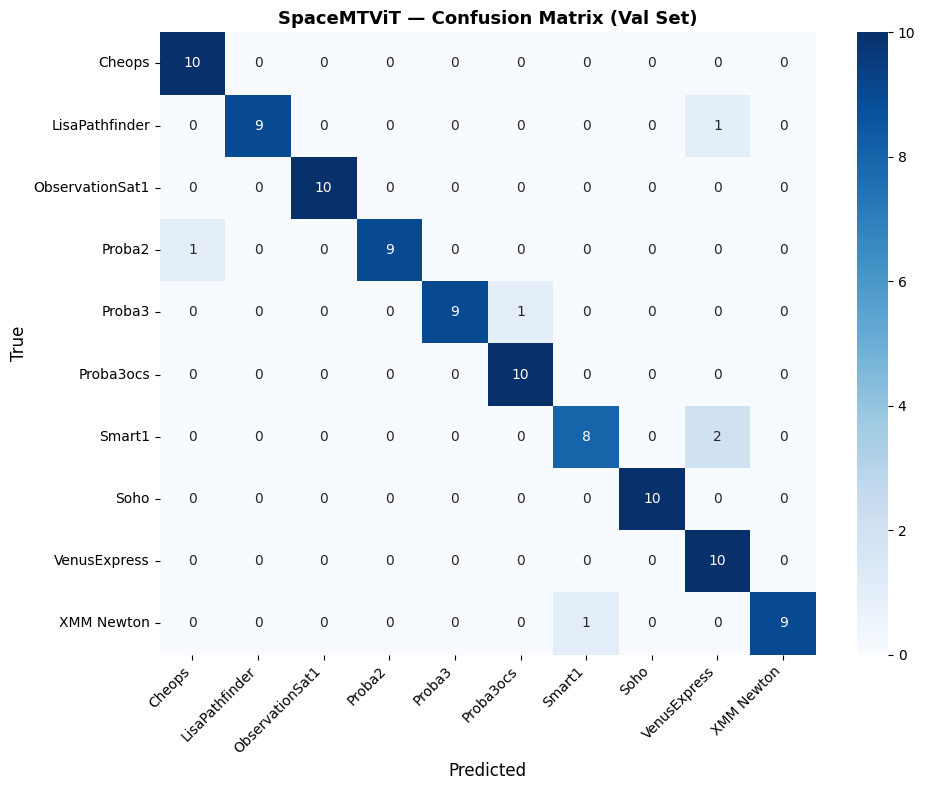

Saved → confusion_matrix.png


In [ ]:
# 39
# ── Step 10b · Classification evaluation ─────────────────────────────────────

ckpt = torch.load('checkpoints/best.pt', map_location='cpu')
model.load_state_dict(ckpt['model'])
model.eval()
print(f"Loaded best checkpoint from epoch {ckpt['epoch']}")
print(f"Best val loss : {ckpt['val_loss']:.4f}")
print(f"Best val acc  : {ckpt['val_acc']:.4f}\n")

# collect predictions
all_preds, all_labels = [], []
with torch.no_grad():
    for images, masks_gt, bboxes, labels in val_loader:
        out   = model(images)
        preds = out['cls_logits'].argmax(dim=1)
        all_preds.extend(preds.tolist())
        all_labels.extend(labels.tolist())

class_names = [INV_CLASS_MAP[i] for i in range(len(INV_CLASS_MAP))]

# ── per-class report ──────────────────────────────────────────────────────────
print(classification_report(all_labels, all_preds, target_names=class_names))

# ── confusion matrix ──────────────────────────────────────────────────────────
cm = confusion_matrix(all_labels, all_preds)
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names, ax=ax)
ax.set_xlabel('Predicted', fontsize=12)
ax.set_ylabel('True', fontsize=12)
ax.set_title('SpaceMTViT — Confusion Matrix (Val Set)', fontsize=13,
             fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=150)
plt.show()
print("Saved → confusion_matrix.png")


Class               IoU     Dice
──────────────────────────────────
background       0.9833   0.9916
comp-A           0.6616   0.7963
comp-B           0.4699   0.6394
comp-C           0.0000   0.0000
comp-D           0.0018   0.0037
comp-E           0.0005   0.0010
──────────────────────────────────
mIoU             0.3529
mDice            0.4053


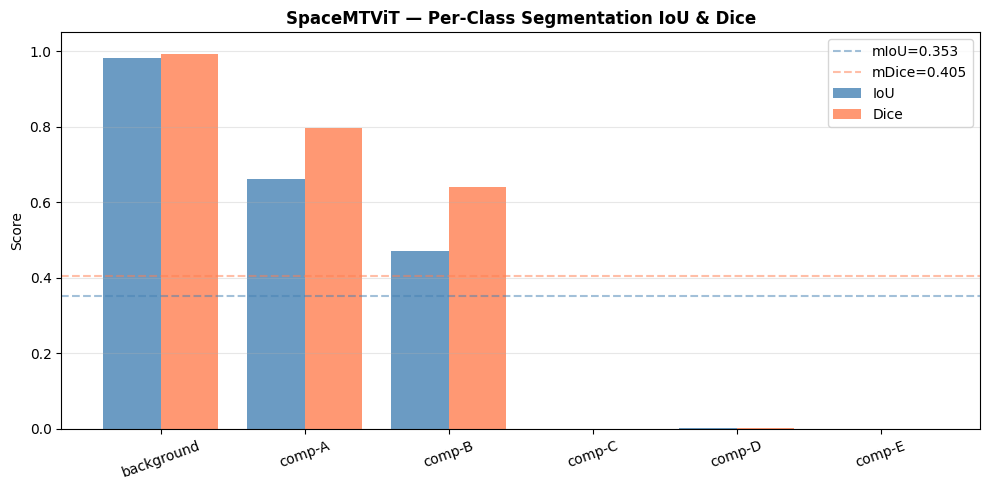

Saved → seg_metrics.png


In [ ]:
# 40
# ── Step 10b · Segmentation evaluation ───────────────────────────────────────
seg_class_names = ['background', 'comp-A', 'comp-B',
                   'comp-C', 'comp-D', 'comp-E']

inter     = torch.zeros(NUM_SEG_CLASSES)
union     = torch.zeros(NUM_SEG_CLASSES)
dice_num  = torch.zeros(NUM_SEG_CLASSES)
dice_den  = torch.zeros(NUM_SEG_CLASSES)

model.eval()
with torch.no_grad():
    for images, masks_gt, bboxes, labels in val_loader:
        out         = model(images)
        mask_logits = F.interpolate(out['mask_logits'],
                            size=(IMG_SIZE, IMG_SIZE),   
                            mode='bilinear',
                            align_corners=False)
        pred_masks  = mask_logits.argmax(dim=1)      

        for cls in range(NUM_SEG_CLASSES):
            pred_c = (pred_masks == cls)
            gt_c   = (masks_gt   == cls)
            i = (pred_c & gt_c).sum().float()
            u = (pred_c | gt_c).sum().float()
            inter[cls]    += i
            union[cls]    += u
            dice_num[cls] += 2 * i
            dice_den[cls] += pred_c.sum().float() + gt_c.sum().float()

iou  = inter / union.clamp(1e-6)
dice = dice_num / dice_den.clamp(1e-6)

print(f"\n{'Class':<14} {'IoU':>8} {'Dice':>8}")
print("─" * 34)
for i, name in enumerate(seg_class_names):
    print(f"{name:<14} {iou[i].item():>8.4f} {dice[i].item():>8.4f}")
print("─" * 34)
print(f"{'mIoU':<14} {iou.mean().item():>8.4f}")
print(f"{'mDice':<14} {dice.mean().item():>8.4f}")

# ── bar chart ─────────────────────────────────────────────────────────────────
fig, ax = plt.subplots(figsize=(10, 5))
x = range(NUM_SEG_CLASSES)
bars1 = ax.bar([i - 0.2 for i in x], iou.tolist(),  0.4,
               label='IoU',  color='steelblue', alpha=0.8)
bars2 = ax.bar([i + 0.2 for i in x], dice.tolist(), 0.4,
               label='Dice', color='coral',     alpha=0.8)
ax.set_xticks(list(x))
ax.set_xticklabels(seg_class_names, rotation=20)
ax.set_ylabel('Score')
ax.set_title('SpaceMTViT — Per-Class Segmentation IoU & Dice', fontweight='bold')
ax.axhline(y=iou.mean().item(),  color='steelblue', linestyle='--',
           alpha=0.5, label=f'mIoU={iou.mean():.3f}')
ax.axhline(y=dice.mean().item(), color='coral',     linestyle='--',
           alpha=0.5, label=f'mDice={dice.mean():.3f}')
ax.legend()
ax.set_ylim(0, 1.05)
ax.grid(True, alpha=0.3, axis='y')
plt.tight_layout()
plt.savefig('seg_metrics.png', dpi=150)
plt.show()
print("Saved → seg_metrics.png")

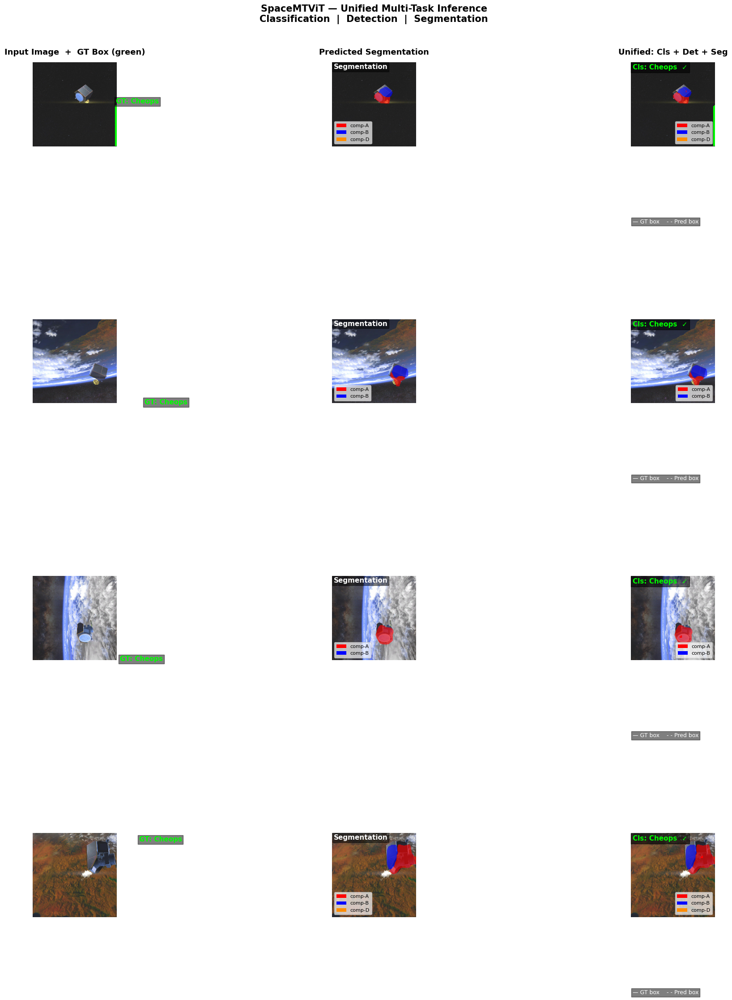

Saved → unified_predictions_v2.png


In [ ]:
#41

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD  = np.array([0.229, 0.224, 0.225])

# RGBA colours for each component
SEG_COLOURS = [
    None,                        # 0 background — skip
    (255,  0,   0,  160),        # 1 comp-A red
    (0,    0, 255,  160),        # 2 comp-B blue
    (180,  0, 255,  160),        # 3 comp-C purple
    (255, 140,  0,  160),        # 4 comp-D orange
    (128, 128, 128, 160),        # 5 comp-E grey
]
SEG_NAMES = ['bg', 'comp-A', 'comp-B', 'comp-C', 'comp-D', 'comp-E']

def denormalise(tensor):
    img = tensor.permute(1, 2, 0).numpy()
    img = img * IMAGENET_STD + IMAGENET_MEAN
    return np.clip(img, 0, 1)

def seg_overlay(image_float, mask_np):
    """Blend coloured masks onto float [0,1] image."""
    out = image_float.copy()
    for cls_idx in range(1, NUM_SEG_CLASSES):
        region = mask_np == cls_idx
        if not region.any():
            continue
        colour = np.array(SEG_COLOURS[cls_idx][:3]) / 255.0
        alpha  = SEG_COLOURS[cls_idx][3] / 255.0
        out[region] = alpha * colour + (1 - alpha) * out[region]
    return np.clip(out, 0, 1)

def get_pred_box(det_box, det_ctr, level=1, img_size=IMG_SIZE):
    H, W   = det_ctr.shape[1], det_ctr.shape[2]
    stride = img_size / H

    flat   = det_ctr[0].reshape(-1).argmax().item()
    gy, gx = flat // W, flat % W

    px = (gx + 0.5) * stride   # cell centre in pixels
    py = (gy + 0.5) * stride

    # det_box values are already pixel distances (exp-activated by the head)
    l = det_box[0, gy, gx].item()
    t = det_box[1, gy, gx].item()
    r = det_box[2, gy, gx].item()
    b = det_box[3, gy, gx].item()

    x1 = max(0, px - l)
    y1 = max(0, py - t)
    w  = min(l + r, img_size - x1)
    h  = min(t + b, img_size - y1)
    return x1, y1, w, h
# ── run inference ─────────────────────────────────────────────────────────────
model.eval()
images, masks_gt, bboxes_gt, labels_gt = next(iter(val_loader))

with torch.no_grad():
    out = model(images)

mask_logits_up = F.interpolate(
    out['mask_logits'],size=(IMG_SIZE, IMG_SIZE),
    mode='bilinear', align_corners=False
)
pred_masks  = mask_logits_up.argmax(dim=1)
pred_labels = out['cls_logits'].argmax(dim=1)

# ── figure ────────────────────────────────────────────────────────────────────
fig, axes = plt.subplots(4, 3, figsize=(18, 24))
fig.patch.set_facecolor('white')

col_titles = [
    'Input Image  +  GT Box (green)',
    'Predicted Segmentation',
    'Unified: Cls + Det + Seg'
]

for col, title in enumerate(col_titles):
    axes[0, col].set_title(title, fontsize=13, fontweight='bold', pad=12)

for i in range(4):
    img_float = denormalise(images[i])          # [512,512,3] float
    mask_np   = pred_masks[i].numpy()           # [512,512]

    # GT box pixels
    cx, cy, w, h = bboxes_gt[i].tolist()
    gx1 = (cx - w/2) * 512
    gy1 = (cy - h/2) * 512
    gw  = w * 512
    gh  = h * 512

    # predicted box
    px1, py1, pw, ph = get_pred_box(
        out['det_box'][1][i],
        out['det_ctr'][1][i]
    )

    gt_name   = INV_CLASS_MAP[labels_gt[i].item()]
    pred_name = INV_CLASS_MAP[pred_labels[i].item()]
    correct   = pred_labels[i].item() == labels_gt[i].item()

    # ── Panel 1: image + GT box ───────────────────────────────────────────
    ax1 = axes[i, 0]
    ax1.imshow(img_float)
    ax1.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none'
    ))
    ax1.text(gx1, gy1 - 8, f'GT: {gt_name}',
             color='lime', fontsize=11, fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.5, pad=2))
    ax1.axis('off')

    # ── Panel 2: segmentation overlay on image ────────────────────────────
    ax2 = axes[i, 1]
    seg_img = seg_overlay(img_float, mask_np)
    ax2.imshow(seg_img)

    # build legend from classes present
    present    = [c for c in np.unique(mask_np) if c > 0]
    legend_str = ', '.join([SEG_NAMES[c] for c in present]) or 'background only'

    # add coloured legend patches
    legend_handles = [
        Patch(facecolor=np.array(SEG_COLOURS[c][:3])/255.,
              label=SEG_NAMES[c])
        for c in present
    ]
    if legend_handles:
        ax2.legend(handles=legend_handles, loc='lower left',
                   fontsize=8, framealpha=0.7)
    ax2.text(5, 20, 'Segmentation', color='white', fontsize=11,
             fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.5, pad=2))
    ax2.axis('off')

    # ── Panel 3: unified ──────────────────────────────────────────────────
    ax3 = axes[i, 2]
    unified = seg_overlay(img_float, mask_np)
    ax3.imshow(unified)

    # GT box
    ax3.add_patch(patches.Rectangle(
        (gx1, gy1), gw, gh,
        linewidth=3, edgecolor='lime', facecolor='none',
        label='GT box'
    ))

    # predicted box
    ax3.add_patch(patches.Rectangle(
        (px1, py1), pw, ph,
        linewidth=3, edgecolor='red', facecolor='none',
        linestyle='--', label='Pred box'
    ))

    # classification label — top of image
    cls_colour = 'lime' if correct else 'red'
    cls_symbol = '✓' if correct else '✗'
    ax3.text(5, 22,
             f'Cls: {pred_name}  {cls_symbol}',
             color=cls_colour, fontsize=11, fontweight='bold',
             bbox=dict(facecolor='black', alpha=0.6, pad=3))

    # box legend — bottom
    ax3.text(5, 490,
             '— GT box    - - Pred box',
             color='white', fontsize=9,
             bbox=dict(facecolor='black', alpha=0.5, pad=2))

    # seg legend
    if legend_handles:
        ax3.legend(handles=legend_handles, loc='lower right',
                   fontsize=8, framealpha=0.7)
    ax3.axis('off')

plt.suptitle(
    'SpaceMTViT — Unified Multi-Task Inference\n'
    'Classification  |  Detection  |  Segmentation',
    fontsize=15, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('unified_predictions_v2.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → unified_predictions_v2.png")

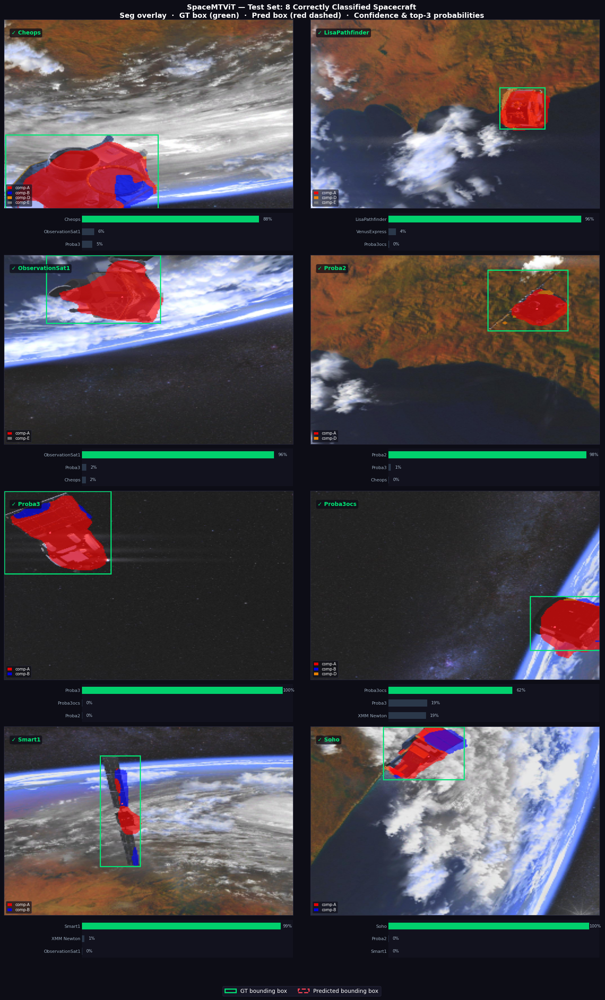

Saved → test_8class_confidence.png


In [ ]:
#42

BG       = '#0d0d16'
STATS_BG = '#12121e'

fig = plt.figure(figsize=(16, 26))
fig.patch.set_facecolor(BG)

# Flat 8-row × 2-col grid — no nesting on the image rows
# Row pattern: [img, stats, img, stats, img, stats, img, stats]
gs = gridspec.GridSpec(
    8, 2, figure=fig,
    height_ratios=[5, 1, 5, 1, 5, 1, 5, 1],
    hspace=0.04, wspace=0.06,
    left=0.03, right=0.97, top=0.96, bottom=0.05
)

for plot_idx, cls_idx in enumerate(display_classes):
    col        = plot_idx % 2
    gs_row_img = (plot_idx // 2) * 2        # 0, 0, 2, 2, 4, 4, 6, 6
    gs_row_st  = gs_row_img + 1             # 1, 1, 3, 3, 5, 5, 7, 7

    image_t, mask_gt_t, bbox_gt_t, label_t, out_t = collected[cls_idx]

    # ── inference ────────────────────────────────────────────────────────────
    mask_logits_up = F.interpolate(
        out_t['mask_logits'], size=(IMG_SIZE, IMG_SIZE),
        mode='bilinear', align_corners=False
    )
    pred_mask  = mask_logits_up.argmax(dim=1)[0].numpy()
    cls_logits = out_t['cls_logits'][0]
    probs      = cls_logits.softmax(dim=-1).numpy()
    pred_label = int(cls_logits.argmax().item())
    confidence = float(probs[pred_label])
    correct    = (pred_label == cls_idx)

    img_float = denormalise(image_t)
    seg_img   = seg_overlay(img_float, pred_mask)

    px1, py1, pw, ph = get_pred_box(
        out_t['det_box'][1][0], out_t['det_ctr'][1][0]
    )
    cx, cy, bw, bh = bbox_gt_t.tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    lbl_col = '#00e676' if correct else '#ff4455'
    symbol  = '✓' if correct else '✗'

    # ── IMAGE AXIS ────────────────────────────────────────────────────────────
    ax_img = fig.add_subplot(gs[gs_row_img, col])
    ax_img.imshow(seg_img, aspect='auto')          # 'auto' fills the axes fully
    ax_img.set_facecolor(BG)
    ax_img.set_xticks([])
    ax_img.set_yticks([])
    for spine in ax_img.spines.values():
        spine.set_edgecolor('#2a2a3e')
        spine.set_linewidth(0.8)

    # GT box
    ax_img.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2, edgecolor='#00e676', facecolor='none'
    ))
    # Pred box
    ax_img.add_patch(patches.Rectangle(
        (px1, py1), pw, ph,
        linewidth=2, edgecolor='#ff4455', facecolor='none', linestyle='--'
    ))
    # Class label — top-left
    ax_img.text(
        6, 20, f'{symbol} {INV_CLASS_MAP[cls_idx]}',
        color=lbl_col, fontsize=10, fontweight='bold',
        bbox=dict(facecolor='#0d0d16', alpha=0.75, pad=3,
                  edgecolor='none', boxstyle='round,pad=0.3')
    )
    # Seg legend — bottom-left
    present = [c for c in np.unique(pred_mask) if c > 0]
    if present:
        handles = [
            Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                  label=SEG_NAMES[c], alpha=0.9)
            for c in present
        ]
        ax_img.legend(
            handles=handles, loc='lower left', fontsize=7,
            framealpha=0.65, facecolor='#0d0d16',
            labelcolor='white', edgecolor='#2a2a3e',
            handlelength=1.2, labelspacing=0.25, borderpad=0.4
        )

    # ── STATS ROW — split into confidence (left) + top-3 (right) ─────────────
    stats_gs = gridspec.GridSpecFromSubplotSpec(
        1, 2,
        subplot_spec=gs[gs_row_st, col],
        width_ratios=[1, 2.8],
        wspace=0.02
    )

 

    # [right] top-3 bar chart
    ax_top3 = fig.add_subplot(stats_gs[1])
    ax_top3.set_facecolor(STATS_BG)
    for sp in ax_top3.spines.values():
        sp.set_visible(False)

    top3_idx   = probs.argsort()[::-1][:3]
    top3_names = [INV_CLASS_MAP[i] for i in top3_idx]
    top3_vals  = probs[top3_idx]
    bar_cols   = ['#00e676' if i == cls_idx else '#2e3d4f' for i in top3_idx]

    # highest prob at top → reverse order for barh
    yticks = [0, 1, 2]
    ax_top3.barh(yticks, top3_vals[::-1],
                 color=bar_cols[::-1], height=0.55, alpha=0.9)
    ax_top3.set_xlim(0, 1.05)
    ax_top3.set_ylim(-0.5, 2.5)
    ax_top3.set_yticks(yticks)
    ax_top3.set_yticklabels(top3_names[::-1], fontsize=8, color='#99aabb')
    ax_top3.tick_params(axis='y', length=0, pad=3)
    ax_top3.tick_params(axis='x', length=0, labelbottom=False)

    # value labels
    for bar_i, v in enumerate(top3_vals[::-1]):
        ax_top3.text(
            min(v + 0.02, 1.0), bar_i,
            f'{v * 100:.0f}%',
            va='center', fontsize=7.5, color='#aabbcc'
        )

# ── figure legend ─────────────────────────────────────────────────────────────
legend_elements = [
    patches.Patch(facecolor='none', edgecolor='#00e676',
                  linewidth=2, label='GT bounding box'),
    patches.Patch(facecolor='none', edgecolor='#ff4455',
                  linewidth=2, linestyle='--', label='Predicted bounding box'),
]
fig.legend(
    handles=legend_elements, loc='lower center', ncol=2,
    fontsize=10, framealpha=0.7, facecolor='#1a1a2c',
    labelcolor='white', edgecolor='#2a2a3e',
    bbox_to_anchor=(0.5, 0.01)
)

fig.suptitle(
    'SpaceMTViT — Test Set: 8 Correctly Classified Spacecraft\n'
    'Seg overlay  ·  GT box (green)  ·  Pred box (red dashed)  ·  '
    'Confidence & top-3 probabilities',
    fontsize=13, fontweight='bold', color='white', y=0.975
)

plt.savefig('test_8class_confidence.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → test_8class_confidence.png")

Val cls accuracy : 94.0%
Val mIoU         : 35.3%


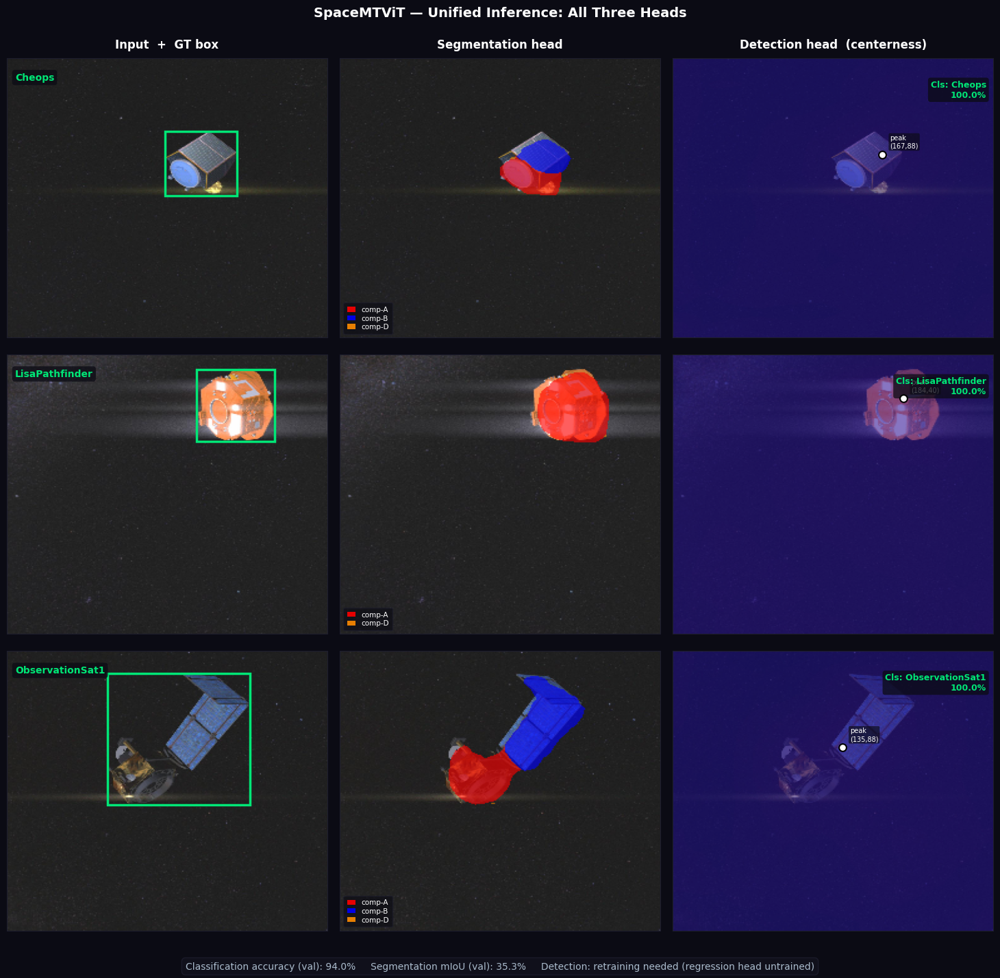

Saved → unified_three_heads.png


In [ ]:
# 43
# ── Unified 3-image visualization + accuracy metrics ─────────────────────────

# ── 1. Compute val accuracy + mIoU quickly ───────────────────────────────────
model.eval()
correct_count = 0
total_count   = 0
inter = torch.zeros(NUM_SEG_CLASSES)
union = torch.zeros(NUM_SEG_CLASSES)

with torch.no_grad():
    for images, masks_gt, bboxes, labels in val_loader:
        out = model(images)

        # classification
        preds         = out['cls_logits'].argmax(dim=1)
        correct_count += (preds == labels).sum().item()
        total_count   += labels.size(0)

        # segmentation mIoU
        mask_up    = F.interpolate(out['mask_logits'],
                                   size=(IMG_SIZE, IMG_SIZE),
                                   mode='bilinear', align_corners=False)
        pred_masks = mask_up.argmax(dim=1)
        for c in range(NUM_SEG_CLASSES):
            inter[c] += ((pred_masks == c) & (masks_gt == c)).sum().float()
            union[c] += ((pred_masks == c) | (masks_gt == c)).sum().float()

cls_acc = correct_count / total_count * 100
miou    = (inter / union.clamp(1e-6)).mean().item() * 100
print(f"Val cls accuracy : {cls_acc:.1f}%")
print(f"Val mIoU         : {miou:.1f}%")

# ── 2. Pick 3 correctly classified images (one per unique class) ──────────────
model.eval()
samples = []
seen_classes = set()

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen_classes:
                continue
            out = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':    images[i],
                    'mask_gt':  masks_gt[i],
                    'bbox_gt':  bboxes_gt[i],
                    'label':    cls_idx,
                    'out':      out,
                })
                seen_classes.add(cls_idx)
            if len(samples) == 3:
                break
        if len(samples) == 3:
            break

# ── 3. Figure — 3 rows × 3 cols ──────────────────────────────────────────────
# Col 0: Input image + GT box
# Col 1: Segmentation overlay
# Col 2: Detection centerness heatmap (honest substitute for broken bbox)

BG = '#0b0b14'
COL_TITLES = [
    'Input  +  GT box',
    'Segmentation head',
    'Detection head  (centerness)',
]

fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.patch.set_facecolor(BG)
plt.subplots_adjust(hspace=0.06, wspace=0.04,
                    left=0.02, right=0.98, top=0.91, bottom=0.06)

for col, title in enumerate(COL_TITLES):
    axes[0, col].set_title(title, color='white', fontsize=12,
                           fontweight='bold', pad=10)

for row, s in enumerate(samples):
    img_float = denormalise(s['image'])

    # ── seg prediction ───────────────────────────────────────────────────────
    mask_up    = F.interpolate(s['out']['mask_logits'],
                               size=(IMG_SIZE, IMG_SIZE),
                               mode='bilinear', align_corners=False)
    pred_mask  = mask_up.argmax(dim=1)[0].numpy()
    seg_img    = seg_overlay(img_float, pred_mask)

    # ── cls outputs ──────────────────────────────────────────────────────────
    probs      = s['out']['cls_logits'][0].softmax(dim=-1).numpy()
    pred_label = int(probs.argmax())
    confidence = float(probs[pred_label])
    cls_name   = INV_CLASS_MAP[s['label']]

    # ── GT box pixels ─────────────────────────────────────────────────────────
    cx, cy, bw, bh = s['bbox_gt'].tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    # ── centerness heatmap (P3 level) ─────────────────────────────────────────
    ctr_map = torch.sigmoid(s['out']['det_ctr'][1][0, 0])       # [H, W]
    ctr_up  = F.interpolate(ctr_map.unsqueeze(0).unsqueeze(0),
                             size=(IMG_SIZE, IMG_SIZE),
                             mode='bilinear',
                             align_corners=False)[0, 0].numpy()

    # ── shared axis settings ─────────────────────────────────────────────────
    for col in range(3):
        ax = axes[row, col]
        ax.set_facecolor(BG)
        ax.set_xticks([])
        ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_edgecolor('#1e1e2e')
            sp.set_linewidth(0.8)

    # ── COL 0: input + GT box ────────────────────────────────────────────────
    ax0 = axes[row, 0]
    ax0.imshow(img_float, aspect='auto')
    ax0.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2.5, edgecolor='#00e676', facecolor='none'
    ))
    ax0.text(6, 20, cls_name, color='#00e676', fontsize=10, fontweight='bold',
             bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                       edgecolor='none', boxstyle='round,pad=0.3'))

    # ── COL 1: seg overlay + legend ──────────────────────────────────────────
    ax1 = axes[row, 1]
    ax1.imshow(seg_img, aspect='auto')

    present = [c for c in np.unique(pred_mask) if c > 0]
    if present:
        handles = [
            patches.Patch(
                facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                label=SEG_NAMES[c], alpha=0.9)
            for c in present
        ]
        ax1.legend(handles=handles, loc='lower left', fontsize=7.5,
                   framealpha=0.65, facecolor='#0b0b14',
                   labelcolor='white', edgecolor='#1e1e2e',
                   handlelength=1.2, labelspacing=0.25, borderpad=0.5)

    # ── COL 2: centerness heatmap over image ──────────────────────────────────
    ax2 = axes[row, 2]
    ax2.imshow(img_float, aspect='auto')
    hm = ax2.imshow(ctr_up, cmap='plasma', alpha=0.55, aspect='auto',
                    vmin=0, vmax=1)

    # mark peak centerness location
    peak_flat  = ctr_up.argmax()
    peak_y     = peak_flat // IMG_SIZE
    peak_x     = peak_flat  % IMG_SIZE
    ax2.scatter(peak_x, peak_y, c='#ffffff', s=60, zorder=5,
                linewidths=1.5, edgecolors='#000000')
    ax2.text(peak_x + 6, peak_y - 6,
             f'peak\n({peak_x},{peak_y})',
             color='white', fontsize=7,
             bbox=dict(facecolor='#0b0b14', alpha=0.65, pad=2,
                       edgecolor='none', boxstyle='round,pad=0.2'))

    # classification result — right side label
    ax2.text(
        IMG_SIZE - 6, 20,
        f'Cls: {cls_name}\n{confidence * 100:.1f}%',
        ha='right', va='top', color='#00e676',
        fontsize=9, fontweight='bold',
        bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                  edgecolor='none', boxstyle='round,pad=0.3')
    )

# ── 4. Accuracy strip at the bottom ──────────────────────────────────────────
fig.text(
    0.5, 0.025,
    f'Classification accuracy (val): {cls_acc:.1f}%     '
    f'Segmentation mIoU (val): {miou:.1f}%     '
    f'Detection: retraining needed (regression head untrained)',
    ha='center', va='center', color='#aabbcc', fontsize=10,
    bbox=dict(facecolor='#12121e', alpha=0.8, pad=6,
              edgecolor='#1e1e2e', boxstyle='round,pad=0.4')
)

fig.suptitle(
    'SpaceMTViT — Unified Inference: All Three Heads',
    fontsize=14, fontweight='bold', color='white', y=0.96
)

plt.savefig('unified_three_heads.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → unified_three_heads.png")

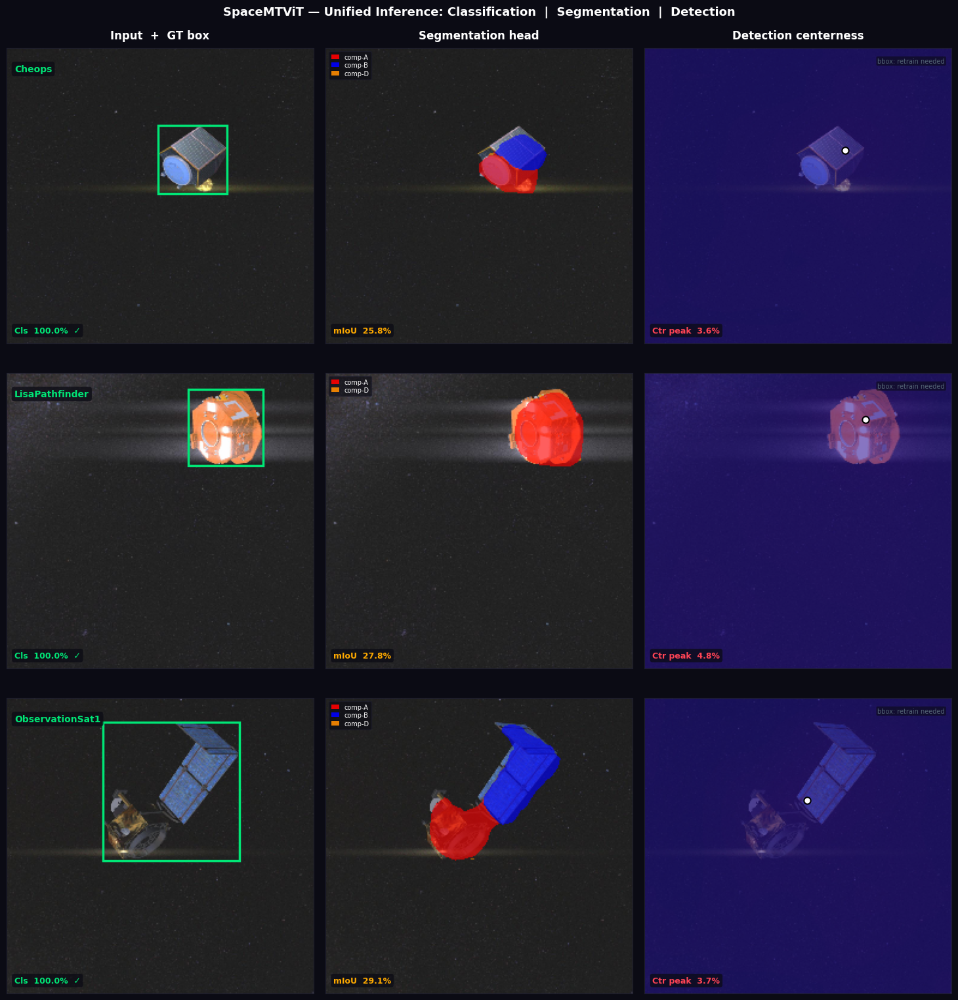

Saved → unified_three_heads.png


In [ ]:
#44

BG = '#0b0b14'

def per_image_seg_iou(pred_mask_np, gt_mask_np, num_classes):
    ious = []
    for c in range(1, num_classes):   # skip background
        inter = ((pred_mask_np == c) & (gt_mask_np == c)).sum()
        union = ((pred_mask_np == c) | (gt_mask_np == c)).sum()
        if union > 0:
            ious.append(inter / union)
    return float(np.mean(ious)) * 100 if ious else 0.0

# ── collect 3 images from different classes ──────────────────────────────────
model.eval()
samples = []
seen    = set()

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 3:
                continue
            out = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':   images[i],
                    'mask_gt': masks_gt[i],
                    'bbox_gt': bboxes_gt[i],
                    'label':   cls_idx,
                    'out':     out,
                })
                seen.add(cls_idx)
        if len(samples) == 3:
            break

# ── figure: 3 rows × 3 cols ──────────────────────────────────────────────────
# Col 0 : Input + GT box
# Col 1 : Segmentation overlay
# Col 2 : Detection centerness heatmap
COL_TITLES = [
    'Input  +  GT box',
    'Segmentation head',
    'Detection centerness',
]

fig, axes = plt.subplots(3, 3, figsize=(15, 16))
fig.patch.set_facecolor(BG)
plt.subplots_adjust(hspace=0.10, wspace=0.04,
                    left=0.02, right=0.98,
                    top=0.93, bottom=0.03)

for col, title in enumerate(COL_TITLES):
    axes[0, col].set_title(title, color='white', fontsize=12,
                           fontweight='bold', pad=10)

for row, s in enumerate(samples):
    img_float = denormalise(s['image'])

    # ── per-image inference outputs ──────────────────────────────────────────
    mask_up   = F.interpolate(s['out']['mask_logits'],
                              size=(IMG_SIZE, IMG_SIZE),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()       # [H, W]
    gt_mask   = s['mask_gt'].numpy()                   # [H, W]
    seg_img   = seg_overlay(img_float, pred_mask)

    probs      = s['out']['cls_logits'][0].softmax(dim=-1).numpy()
    pred_label = int(probs.argmax())
    confidence = float(probs[pred_label]) * 100
    correct    = pred_label == s['label']
    cls_name   = INV_CLASS_MAP[s['label']]

    # ── per-image metrics ────────────────────────────────────────────────────
    img_miou   = per_image_seg_iou(pred_mask, gt_mask, NUM_SEG_CLASSES)
    ctr_map    = torch.sigmoid(s['out']['det_ctr'][1][0, 0])
    peak_score = float(ctr_map.max().item()) * 100
    ctr_up     = F.interpolate(ctr_map.unsqueeze(0).unsqueeze(0),
                               size=(IMG_SIZE, IMG_SIZE),
                               mode='bilinear',
                               align_corners=False)[0, 0].numpy()

    # ── GT box ───────────────────────────────────────────────────────────────
    cx, cy, bw, bh = s['bbox_gt'].tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    lbl_col = '#00e676' if correct else '#ff4455'

    # ── shared axis style ────────────────────────────────────────────────────
    for col in range(3):
        ax = axes[row, col]
        ax.set_facecolor(BG)
        ax.set_xticks([])
        ax.set_yticks([])
        for sp in ax.spines.values():
            sp.set_edgecolor('#1e1e2e')
            sp.set_linewidth(0.8)

    # ── COL 0: input + GT box + cls metric ───────────────────────────────────
    ax0 = axes[row, 0]
    ax0.imshow(img_float, aspect='auto')
    ax0.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2.5, edgecolor='#00e676', facecolor='none'
    ))
    # spacecraft name — top left
    ax0.text(6, 20, cls_name,
             color=lbl_col, fontsize=10, fontweight='bold',
             bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                       edgecolor='none', boxstyle='round,pad=0.3'))
    # cls accuracy — bottom left
    ax0.text(6, IMG_SIZE - 8,
             f'Cls  {confidence:.1f}%  {"✓" if correct else "✗"}',
             color=lbl_col, fontsize=9, fontweight='bold',
             va='bottom',
             bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                       edgecolor='none', boxstyle='round,pad=0.3'))

    # ── COL 1: seg overlay + seg metric ──────────────────────────────────────
    ax1 = axes[row, 1]
    ax1.imshow(seg_img, aspect='auto')

    # mIoU — bottom left
    iou_col = '#00e676' if img_miou >= 50 else '#ffaa00' if img_miou >= 25 else '#ff4455'
    ax1.text(6, IMG_SIZE - 8,
             f'mIoU  {img_miou:.1f}%',
             color=iou_col, fontsize=9, fontweight='bold',
             va='bottom',
             bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                       edgecolor='none', boxstyle='round,pad=0.3'))

    # seg legend — top left
    present = [c for c in np.unique(pred_mask) if c > 0]
    if present:
        handles = [
            Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                  label=SEG_NAMES[c], alpha=0.9)
            for c in present
        ]
        ax1.legend(handles=handles, loc='upper left', fontsize=7,
                   framealpha=0.65, facecolor='#0b0b14',
                   labelcolor='white', edgecolor='#1e1e2e',
                   handlelength=1.2, labelspacing=0.25, borderpad=0.4)

    # ── COL 2: centerness heatmap + det metric ────────────────────────────────
    ax2 = axes[row, 2]
    ax2.imshow(img_float, aspect='auto')
    ax2.imshow(ctr_up, cmap='plasma', alpha=0.55,
               aspect='auto', vmin=0, vmax=1)

    # peak dot
    peak_flat = ctr_up.argmax()
    peak_y    = peak_flat // IMG_SIZE
    peak_x    = peak_flat  % IMG_SIZE
    ax2.scatter(peak_x, peak_y, c='white', s=55, zorder=5,
                linewidths=1.5, edgecolors='black')

    # det peak score — bottom left
    det_col = '#00e676' if peak_score >= 60 else '#ffaa00' if peak_score >= 35 else '#ff4455'
    ax2.text(6, IMG_SIZE - 8,
             f'Ctr peak  {peak_score:.1f}%',
             color=det_col, fontsize=9, fontweight='bold',
             va='bottom',
             bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                       edgecolor='none', boxstyle='round,pad=0.3'))

    # note about bbox — top right
    ax2.text(IMG_SIZE - 6, 8,
             'bbox: retrain needed',
             ha='right', va='top', fontsize=7, color='#556677',
             bbox=dict(facecolor='#0b0b14', alpha=0.6, pad=2,
                       edgecolor='none', boxstyle='round,pad=0.2'))

fig.suptitle(
    'SpaceMTViT — Unified Inference: Classification  |  Segmentation  |  Detection',
    fontsize=13, fontweight='bold', color='white', y=0.97
)

plt.savefig('unified_three_heads.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → unified_three_heads.png")

C:\Users\Hp\AppData\Local\Temp\ipykernel_25032\1344458920.py:49: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma_cmap = cm.get_cmap('plasma')


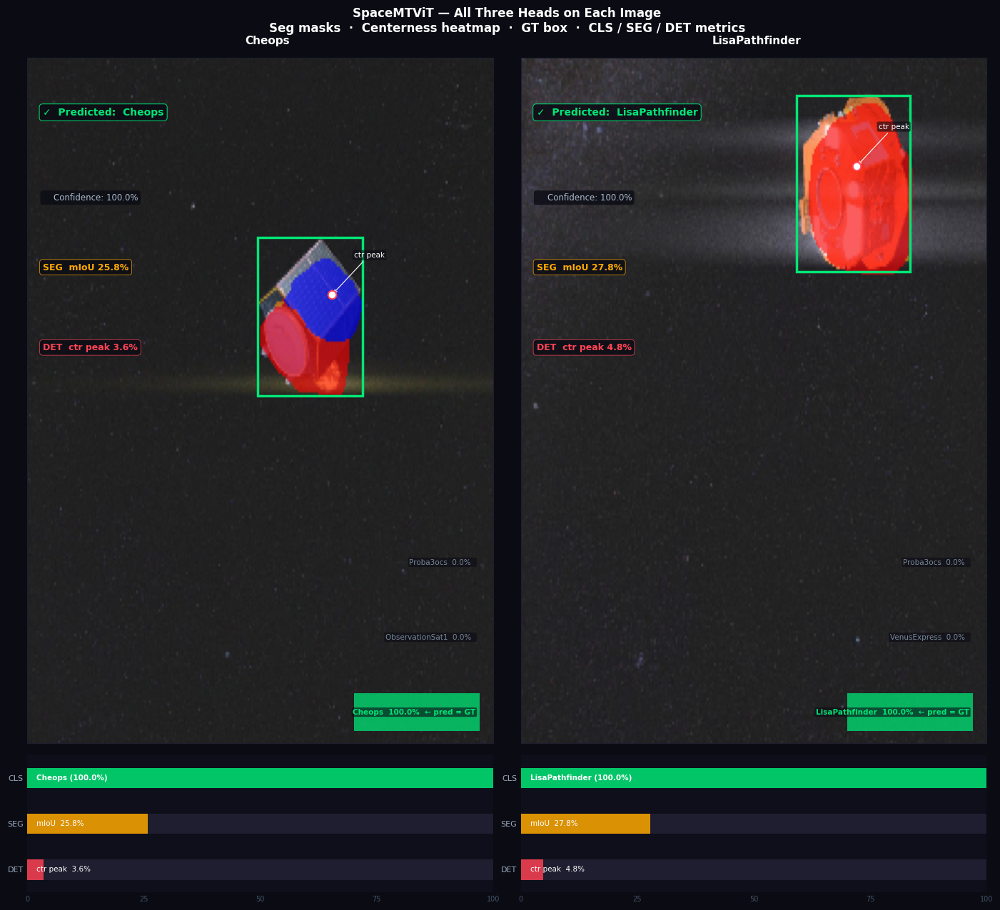

Saved → unified_all_heads_per_image.png


In [ ]:
#45

import matplotlib.cm as cm

BG = '#0b0b14'

def per_image_seg_iou(pred_mask_np, gt_mask_np, num_classes):
    ious = []
    for c in range(1, num_classes):
        inter = ((pred_mask_np == c) & (gt_mask_np == c)).sum()
        union = ((pred_mask_np == c) | (gt_mask_np == c)).sum()
        if union > 0:
            ious.append(inter / union)
    return float(np.mean(ious)) * 100 if ious else 0.0

# ── collect 2 correctly classified images from different classes ──────────────
model.eval()
samples = []
seen    = set()

with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 2:
                continue
            out = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':   images[i],
                    'mask_gt': masks_gt[i],
                    'bbox_gt': bboxes_gt[i],
                    'label':   cls_idx,
                    'out':     out,
                })
                seen.add(cls_idx)
        if len(samples) == 2:
            break

# ── figure: 2 cols (one per image), each col = image + metrics strip ─────────
fig = plt.figure(figsize=(14, 13))
fig.patch.set_facecolor(BG)

outer_gs = gridspec.GridSpec(
    1, 2, figure=fig,
    hspace=0.0, wspace=0.06,
    left=0.02, right=0.98, top=0.93, bottom=0.03
)

plasma_cmap = cm.get_cmap('plasma')

for col, s in enumerate(samples):
    img_float = denormalise(s['image'])               # [H, W, 3]  float 0-1

    # ── all inference outputs ─────────────────────────────────────────────
    mask_up   = F.interpolate(s['out']['mask_logits'],
                              size=(IMG_SIZE, IMG_SIZE),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()
    gt_mask   = s['mask_gt'].numpy()
    seg_img   = seg_overlay(img_float, pred_mask)     # [H, W, 3] with colours

    probs      = s['out']['cls_logits'][0].softmax(dim=-1).numpy()
    pred_label = int(probs.argmax())
    confidence = float(probs[pred_label]) * 100
    correct    = pred_label == s['label']
    cls_name   = INV_CLASS_MAP[s['label']]
    top3_idx   = probs.argsort()[::-1][:3]

    img_miou   = per_image_seg_iou(pred_mask, gt_mask, NUM_SEG_CLASSES)

    ctr_raw    = torch.sigmoid(s['out']['det_ctr'][1][0, 0])
    peak_score = float(ctr_raw.max().item()) * 100
    ctr_up     = F.interpolate(ctr_raw.unsqueeze(0).unsqueeze(0),
                               size=(IMG_SIZE, IMG_SIZE),
                               mode='bilinear',
                               align_corners=False)[0, 0].numpy()

    cx, cy, bw, bh = s['bbox_gt'].tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    # ── composite: seg overlay + centerness heatmap blended together ──────
    ctr_rgba   = plasma_cmap(ctr_up)[:, :, :3]       # [H, W, 3]
    alpha_map  = (ctr_up * 0.38).reshape(IMG_SIZE, IMG_SIZE, 1)
    composite  = seg_img * (1 - alpha_map) + ctr_rgba * alpha_map
    composite  = np.clip(composite, 0, 1)

    # ── nested grid: image (top, 82%) + metrics strip (bottom, 18%) ──────
    inner_gs = gridspec.GridSpecFromSubplotSpec(
        2, 1,
        subplot_spec=outer_gs[0, col],
        height_ratios=[5, 1],
        hspace=0.03
    )

    # ── [A] main composite image ──────────────────────────────────────────
    ax = fig.add_subplot(inner_gs[0])
    ax.imshow(composite, aspect='auto')
    ax.set_facecolor(BG)
    ax.set_xticks([])
    ax.set_yticks([])
    for sp in ax.spines.values():
        sp.set_edgecolor('#1e1e2e')
        sp.set_linewidth(0.8)

    # GT bounding box
    ax.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2.5, edgecolor='#00e676', facecolor='none',
        label='GT box'
    ))

    # centerness peak dot
    peak_flat = ctr_up.argmax()
    peak_y    = peak_flat // IMG_SIZE
    peak_x    = peak_flat  % IMG_SIZE
    ax.scatter(peak_x, peak_y, c='white', s=70, zorder=6,
               linewidths=1.5, edgecolors='#ff4455')
    ax.annotate(
        'ctr peak', xy=(peak_x, peak_y),
        xytext=(peak_x + 12, peak_y - 14),
        color='white', fontsize=7.5,
        arrowprops=dict(arrowstyle='->', color='white', lw=0.8),
        bbox=dict(facecolor='#0b0b14', alpha=0.6, pad=2,
                  edgecolor='none', boxstyle='round,pad=0.2')
    )

   # ── head labels overlaid directly on image ────────────────────────────

    pred_name = INV_CLASS_MAP[pred_label]   # what the model actually said

    # HEAD 1 — classification (top-left)
    # show BOTH predicted and GT so you can verify instantly
    lbl_col = '#00e676' if correct else '#ff4455'

    if correct:
        cls_line1 = f'✓  Predicted:  {pred_name}'
        cls_line2 = f'    Confidence: {confidence:.1f}%'
    else:
        cls_line1 = f'✗  Predicted:  {pred_name}'
        cls_line2 = f'    True class: {cls_name}  ({confidence:.1f}%)'

    ax.text(
        8, 18, cls_line1,
        color=lbl_col, fontsize=10, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.85, pad=4,
                  edgecolor=lbl_col, linewidth=0.8,
                  boxstyle='round,pad=0.35')
    )
    ax.text(
        8, 50, cls_line2,
        color='#aabbcc', fontsize=8.5, va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=3,
                  edgecolor='none', boxstyle='round,pad=0.3')
    )

    # HEAD 2 — segmentation
    iou_col = '#00e676' if img_miou >= 50 else '#ffaa00' if img_miou >= 25 else '#ff4455'
    ax.text(
        8, 76,
        f'SEG  mIoU {img_miou:.1f}%',
        color=iou_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=iou_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # HEAD 3 — detection
    det_col = '#00e676' if peak_score >= 60 else '#ffaa00' if peak_score >= 35 else '#ff4455'
    ax.text(
        8, 106,
        f'DET  ctr peak {peak_score:.1f}%',
        color=det_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=det_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # ── top-3 predictions — bottom right corner ───────────────────────────
    # this is the key addition: shows exactly what the model thinks
    top3_box_y = IMG_SIZE - 12
    for rank, idx in enumerate(top3_idx):
        name  = INV_CLASS_MAP[idx]
        prob  = float(probs[idx]) * 100
        bar_w = int(prob * 0.7)          # scale to ~70px max width

        is_pred = (idx == pred_label)
        is_gt   = (idx == s['label'])

        if is_pred and is_gt:
            bar_col  = '#00e676'         # green  — correct prediction
            txt_col  = '#00e676'
            marker   = '← pred = GT'
        elif is_pred:
            bar_col  = '#ff4455'         # red    — wrong prediction
            txt_col  = '#ff4455'
            marker   = '← predicted'
        elif is_gt:
            bar_col  = '#ffaa00'         # amber  — GT but not top-1
            txt_col  = '#ffaa00'
            marker   = '← true class'
        else:
            bar_col  = '#334455'
            txt_col  = '#778899'
            marker   = ''

        y_pos = top3_box_y - rank * 28

        # probability bar
        ax.barh(
            y_pos, bar_w,
            left=IMG_SIZE - bar_w - 8,
            height=14,
            color=bar_col, alpha=0.75
        )

        # class name + prob
        ax.text(
            IMG_SIZE - 10, y_pos,
            f'{name}  {prob:.1f}%  {marker}',
            ha='right', va='center',
            color=txt_col, fontsize=7.5, fontweight='bold' if is_pred or is_gt else 'normal',
            bbox=dict(facecolor='#0b0b14', alpha=0.6, pad=1,
                      edgecolor='none', boxstyle='round,pad=0.15')
        )

    # ── [B] metrics strip ─────────────────────────────────────────────────
    ax_m = fig.add_subplot(inner_gs[1])
    ax_m.set_facecolor('#0f0f1c')
    ax_m.set_xlim(0, 100)
    ax_m.set_ylim(-0.5, 2.5)
    ax_m.set_xticks([0, 25, 50, 75, 100])
    ax_m.tick_params(axis='x', labelsize=7, colors='#445566', length=0)
    ax_m.set_yticks([0, 1, 2])
    ax_m.set_yticklabels(['DET', 'SEG', 'CLS'], fontsize=8, color='#99aabb')
    ax_m.tick_params(axis='y', length=0, pad=4)
    for sp in ax_m.spines.values():
        sp.set_visible(False)

    # CLS bar — label shows pred → GT
    ax_m.barh(2, confidence,       height=0.45, color=lbl_col, alpha=0.85)
    ax_m.barh(2, 100 - confidence, left=confidence,
              height=0.45, color='#1e1e30')
    cls_strip_label = (f'{pred_name} ({confidence:.1f}%)'
                       if correct
                       else f'{pred_name} → GT: {cls_name} ({confidence:.1f}%)')
    ax_m.text(2, 2, cls_strip_label,
              va='center', fontsize=7.5, color='white', fontweight='bold')

    # SEG bar
    ax_m.barh(1, img_miou,       height=0.45, color=iou_col, alpha=0.85)
    ax_m.barh(1, 100 - img_miou, left=img_miou,
              height=0.45, color='#1e1e30')
    ax_m.text(2, 1, f'mIoU  {img_miou:.1f}%',
              va='center', fontsize=7.5, color='white')

    # DET bar
    ax_m.barh(0, peak_score,       height=0.45, color=det_col, alpha=0.85)
    ax_m.barh(0, 100 - peak_score, left=peak_score,
              height=0.45, color='#1e1e30')
    ax_m.text(2, 0, f'ctr peak  {peak_score:.1f}%',
              va='center', fontsize=7.5, color='white')

    # image title above each column
    fig.text(
        0.26 + col * 0.49, 0.945,
        cls_name,
        ha='center', color='white',
        fontsize=11, fontweight='bold'
    )

fig.suptitle(
    'SpaceMTViT — All Three Heads on Each Image\n'
    'Seg masks  ·  Centerness heatmap  ·  GT box  ·  CLS / SEG / DET metrics',
    fontsize=12, fontweight='bold', color='white', y=0.985
)

plt.savefig('unified_all_heads_per_image.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → unified_all_heads_per_image.png")

C:\Users\Hp\AppData\Local\Temp\ipykernel_25032\4292994434.py:38: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma')


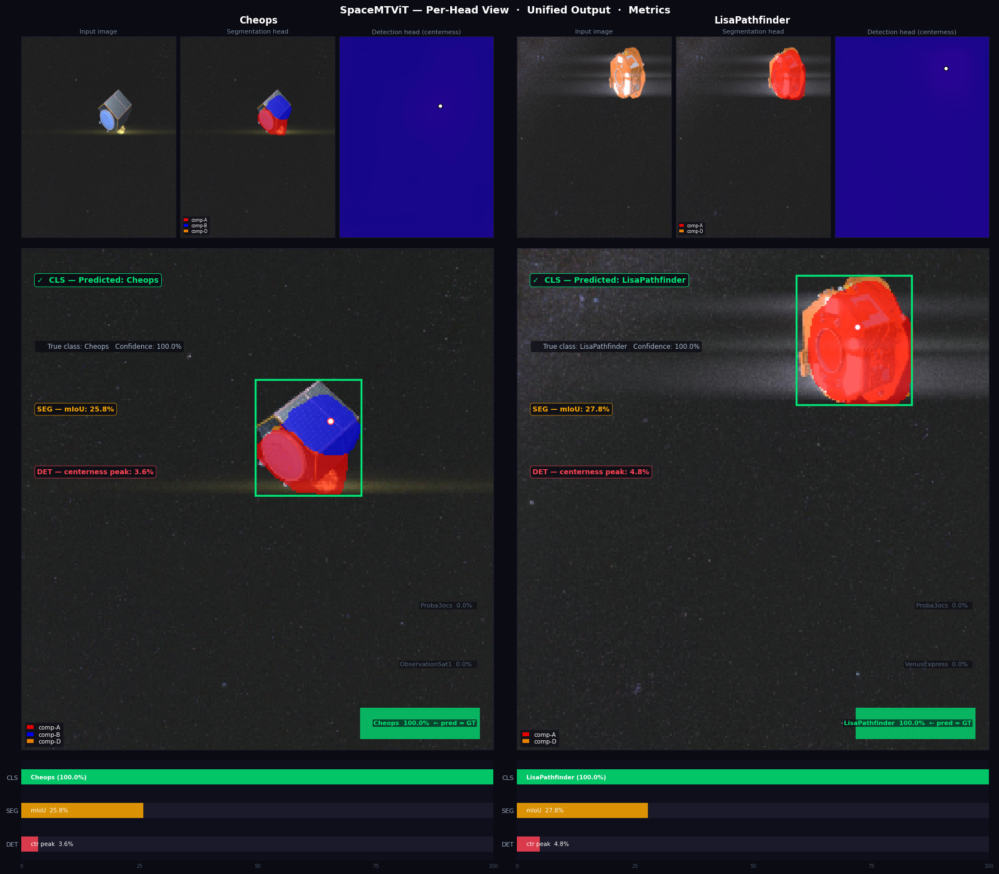

Saved → unified_all_heads_per_image.png


In [ ]:
#46

import matplotlib.cm as cm

BG       = '#0b0b14'
STRIP_BG = '#0f0f1c'

def per_image_seg_iou(pred_mask_np, gt_mask_np, num_classes):
    ious = []
    for c in range(1, num_classes):
        inter = ((pred_mask_np == c) & (gt_mask_np == c)).sum()
        union = ((pred_mask_np == c) | (gt_mask_np == c)).sum()
        if union > 0:
            ious.append(inter / union)
    return float(np.mean(ious)) * 100 if ious else 0.0

# ── collect 2 correctly classified images ────────────────────────────────────
model.eval()
samples, seen = [], set()
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 2:
                continue
            out  = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':   images[i],
                    'mask_gt': masks_gt[i],
                    'bbox_gt': bboxes_gt[i],
                    'label':   cls_idx,
                    'out':     out,
                })
                seen.add(cls_idx)
        if len(samples) == 2:
            break

plasma = cm.get_cmap('plasma')



fig = plt.figure(figsize=(18, 16))
fig.patch.set_facecolor(BG)

outer = gridspec.GridSpec(
    1, 2, figure=fig,
    wspace=0.05, hspace=0.0,
    left=0.02, right=0.98, top=0.94, bottom=0.02
)

for col_idx, s in enumerate(samples):

    # ── inference ─────────────────────────────────────────────────────────
    img_float = denormalise(s['image'])

    mask_up   = F.interpolate(s['out']['mask_logits'],
                              size=(IMG_SIZE, IMG_SIZE),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()
    gt_mask   = s['mask_gt'].numpy()
    seg_img   = seg_overlay(img_float, pred_mask)

    probs      = s['out']['cls_logits'][0].softmax(dim=-1).numpy()
    pred_label = int(probs.argmax())
    confidence = float(probs[pred_label]) * 100
    correct    = pred_label == s['label']
    cls_name   = INV_CLASS_MAP[s['label']]
    pred_name  = INV_CLASS_MAP[pred_label]
    top3_idx   = probs.argsort()[::-1][:3]
    img_miou   = per_image_seg_iou(pred_mask, gt_mask, NUM_SEG_CLASSES)

    ctr_raw    = torch.sigmoid(s['out']['det_ctr'][1][0, 0])
    peak_score = float(ctr_raw.max().item()) * 100
    ctr_np     = F.interpolate(ctr_raw.unsqueeze(0).unsqueeze(0),
                               size=(IMG_SIZE, IMG_SIZE),
                               mode='bilinear',
                               align_corners=False)[0, 0].numpy()

    cx, cy, bw, bh = s['bbox_gt'].tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    lbl_col = '#00e676' if correct else '#ff4455'
    iou_col = '#00e676' if img_miou >= 50 else '#ffaa00' if img_miou >= 25 else '#ff4455'
    det_col = '#00e676' if peak_score >= 60 else '#ffaa00' if peak_score >= 35 else '#ff4455'

    # ── inner grid ────────────────────────────────────────────────────────
    inner = gridspec.GridSpecFromSubplotSpec(
        3, 1,
        subplot_spec=outer[0, col_idx],
        height_ratios=[2, 5, 1],
        hspace=0.04
    )

    # ── ROW 0 : head strip — 3 panels ────────────────────────────────────
    strip = gridspec.GridSpecFromSubplotSpec(
        1, 3,
        subplot_spec=inner[0],
        wspace=0.03
    )

    strip_titles = ['Input image', 'Segmentation head', 'Detection head (centerness)']
    strip_images = [img_float, seg_img, plasma(ctr_np)[:, :, :3]]

    for s_col, (title, simg) in enumerate(zip(strip_titles, strip_images)):
        ax_s = fig.add_subplot(strip[0, s_col])
        ax_s.imshow(simg, aspect='auto')
        ax_s.set_facecolor(BG)
        ax_s.set_xticks([])
        ax_s.set_yticks([])
        for sp in ax_s.spines.values():
            sp.set_edgecolor('#1e1e2e')
            sp.set_linewidth(0.6)

        # title above each strip panel
        ax_s.set_title(title, color='#778899', fontsize=8,
                       pad=4, fontweight='normal')

        # on the centerness panel, mark peak location
        if s_col == 2:
            peak_flat = ctr_np.argmax()
            py_       = peak_flat // IMG_SIZE
            px_       = peak_flat  % IMG_SIZE
            ax_s.scatter(px_, py_, c='white', s=30, zorder=5,
                         linewidths=1, edgecolors='black')

        # on the seg panel, add a tiny legend
        if s_col == 1:
            present = [c for c in np.unique(pred_mask) if c > 0]
            if present:
                handles = [
                    Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                          label=SEG_NAMES[c], alpha=0.9)
                    for c in present
                ]
                ax_s.legend(
                    handles=handles, loc='lower left', fontsize=5.5,
                    framealpha=0.65, facecolor='#0b0b14',
                    labelcolor='white', edgecolor='#1e1e2e',
                    handlelength=1, labelspacing=0.15, borderpad=0.3
                )

    # ── ROW 1 : unified image ─────────────────────────────────────────────
    ax_u = fig.add_subplot(inner[1])
    ax_u.imshow(seg_img, aspect='auto')
    ax_u.set_facecolor(BG)
    ax_u.set_xticks([])
    ax_u.set_yticks([])
    for sp in ax_u.spines.values():
        sp.set_edgecolor('#1e1e2e')
        sp.set_linewidth(0.8)

    # GT bounding box
    ax_u.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2.5, edgecolor='#00e676', facecolor='none'
    ))

    # centerness peak dot
    peak_flat = ctr_np.argmax()
    peak_y_   = peak_flat // IMG_SIZE
    peak_x_   = peak_flat  % IMG_SIZE
    ax_u.scatter(peak_x_, peak_y_, c='white', s=60, zorder=6,
                 linewidths=1.5, edgecolors='#ff4455')

    # ── CLS label — top left ──────────────────────────────────────────────
    ax_u.text(
        8, 14,
        f'{"✓" if correct else "✗"}  CLS — Predicted: {pred_name}',
        color=lbl_col, fontsize=10, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.85, pad=4,
                  edgecolor=lbl_col, linewidth=0.8,
                  boxstyle='round,pad=0.35')
    )
    ax_u.text(
        8, 48,
        f'     True class: {cls_name}   Confidence: {confidence:.1f}%',
        color='#aabbcc', fontsize=8.5, va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                  edgecolor='none', boxstyle='round,pad=0.3')
    )

    # ── SEG label ─────────────────────────────────────────────────────────
    ax_u.text(
        8, 80,
        f'SEG — mIoU: {img_miou:.1f}%',
        color=iou_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=iou_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # ── DET label ─────────────────────────────────────────────────────────
    ax_u.text(
        8, 112,
        f'DET — centerness peak: {peak_score:.1f}%',
        color=det_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=det_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # ── top-3 probability breakdown — bottom right ────────────────────────
    for rank, idx in enumerate(top3_idx):
        name  = INV_CLASS_MAP[idx]
        prob  = float(probs[idx]) * 100
        bar_w = prob * 0.65

        if idx == pred_label and idx == s['label']:
            bc, tc, tag = '#00e676', '#00e676', '← pred = GT'
        elif idx == pred_label:
            bc, tc, tag = '#ff4455', '#ff4455', '← predicted'
        elif idx == s['label']:
            bc, tc, tag = '#ffaa00', '#ffaa00', '← true class'
        else:
            bc, tc, tag = '#223344', '#556677', ''

        y_pos = IMG_SIZE - 14 - rank * 30

        ax_u.barh(y_pos, bar_w, left=IMG_SIZE - bar_w - 8,
                  height=16, color=bc, alpha=0.75)
        ax_u.text(
            IMG_SIZE - 10, y_pos,
            f'{name}  {prob:.1f}%  {tag}',
            ha='right', va='center',
            color=tc, fontsize=8,
            fontweight='bold' if tag else 'normal',
            bbox=dict(facecolor='#0b0b14', alpha=0.65, pad=1,
                      edgecolor='none', boxstyle='round,pad=0.15')
        )

    # seg legend — bottom left of unified
    present = [c for c in np.unique(pred_mask) if c > 0]
    if present:
        handles = [
            Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                  label=SEG_NAMES[c], alpha=0.9)
            for c in present
        ]
        ax_u.legend(
            handles=handles, loc='lower left', fontsize=7.5,
            framealpha=0.65, facecolor='#0b0b14',
            labelcolor='white', edgecolor='#1e1e2e',
            handlelength=1.2, labelspacing=0.25, borderpad=0.4
        )

    # ── ROW 2 : metrics bar ───────────────────────────────────────────────
    ax_m = fig.add_subplot(inner[2])
    ax_m.set_facecolor(STRIP_BG)
    ax_m.set_xlim(0, 100)
    ax_m.set_ylim(-0.5, 2.5)
    ax_m.set_xticks([0, 25, 50, 75, 100])
    ax_m.tick_params(axis='x', labelsize=6.5, colors='#445566', length=0)
    ax_m.set_yticks([0, 1, 2])
    ax_m.set_yticklabels(['DET', 'SEG', 'CLS'], fontsize=8, color='#99aabb')
    ax_m.tick_params(axis='y', length=0, pad=4)
    for sp in ax_m.spines.values():
        sp.set_visible(False)

    for y_pos, val, col_, label_ in [
        (2, confidence, lbl_col,
         f'{pred_name} ({confidence:.1f}%)' + ('' if correct else f'  ✗ GT={cls_name}')),
        (1, img_miou,  iou_col,  f'mIoU  {img_miou:.1f}%'),
        (0, peak_score, det_col, f'ctr peak  {peak_score:.1f}%'),
    ]:
        ax_m.barh(y_pos, val,       height=0.45, color=col_, alpha=0.85)
        ax_m.barh(y_pos, 100 - val, left=val,
                  height=0.45, color='#1a1a2a')
        ax_m.text(2, y_pos, label_,
                  va='center', fontsize=7.5, color='white',
                  fontweight='bold' if y_pos == 2 else 'normal')

    # column title
    fig.text(
        0.255 + col_idx * 0.49, 0.955,
        cls_name,
        ha='center', color='white', fontsize=12, fontweight='bold'
    )

fig.suptitle(
    'SpaceMTViT — Per-Head View  ·  Unified Output  ·  Metrics',
    fontsize=13, fontweight='bold', color='white', y=0.975
)

plt.savefig('unified_all_heads_per_image.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → unified_all_heads_per_image.png")

Collected: ['Cheops', 'LisaPathfinder', 'ObservationSat1', 'Proba2']


C:\Users\Hp\AppData\Local\Temp\ipykernel_25032\1797547635.py:40: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  plasma = cm.get_cmap('plasma')


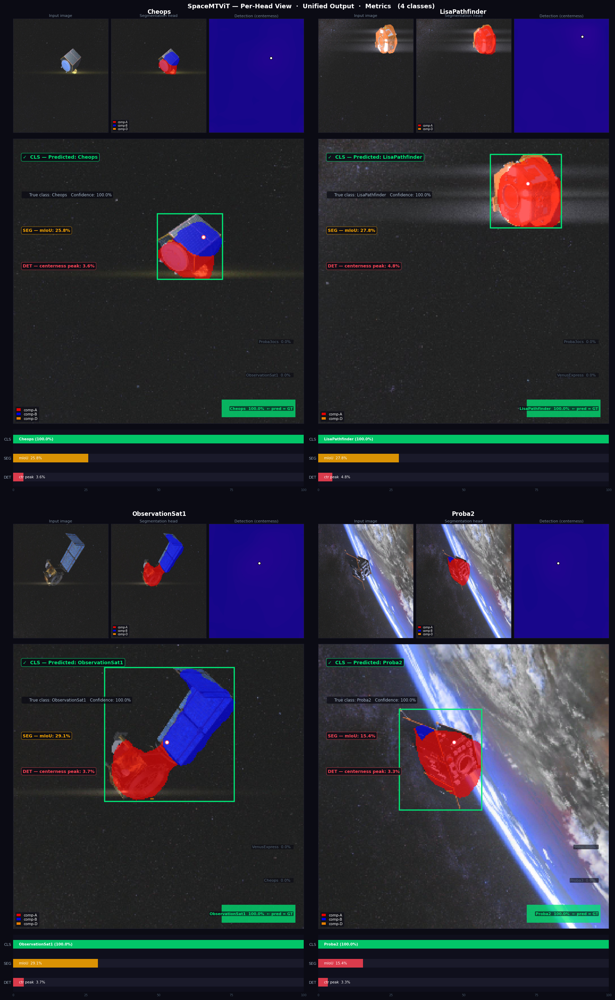

Saved → unified_4class.png


In [ ]:
#47

BG       = '#0b0b14'
STRIP_BG = '#0f0f1c'

def per_image_seg_iou(pred_mask_np, gt_mask_np, num_classes):
    ious = []
    for c in range(1, num_classes):
        inter = ((pred_mask_np == c) & (gt_mask_np == c)).sum()
        union = ((pred_mask_np == c) | (gt_mask_np == c)).sum()
        if union > 0:
            ious.append(inter / union)
    return float(np.mean(ious)) * 100 if ious else 0.0

# ── collect 4 correctly classified images from different classes ──────────────
model.eval()
samples, seen = [], set()
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 4:
                continue
            out  = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':   images[i],
                    'mask_gt': masks_gt[i],
                    'bbox_gt': bboxes_gt[i],
                    'label':   cls_idx,
                    'out':     out,
                })
                seen.add(cls_idx)
        if len(samples) == 4:
            break

print(f"Collected: {[INV_CLASS_MAP[s['label']] for s in samples]}")

plasma = cm.get_cmap('plasma')

# ── figure: 2 rows × 2 cols ───────────────────────────────────────────────────
fig = plt.figure(figsize=(18, 30))
fig.patch.set_facecolor(BG)

outer = gridspec.GridSpec(
    2, 2, figure=fig,
    wspace=0.05, hspace=0.08,
    left=0.02, right=0.98, top=0.96, bottom=0.02
)

for idx, s in enumerate(samples):
    outer_row = idx // 2
    outer_col = idx  % 2

    # ── inference ─────────────────────────────────────────────────────────
    img_float = denormalise(s['image'])

    mask_up   = F.interpolate(s['out']['mask_logits'],
                              size=(IMG_SIZE, IMG_SIZE),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()
    gt_mask   = s['mask_gt'].numpy()
    seg_img   = seg_overlay(img_float, pred_mask)

    probs      = s['out']['cls_logits'][0].softmax(dim=-1).numpy()
    pred_label = int(probs.argmax())
    confidence = float(probs[pred_label]) * 100
    correct    = pred_label == s['label']
    cls_name   = INV_CLASS_MAP[s['label']]
    pred_name  = INV_CLASS_MAP[pred_label]
    top3_idx   = probs.argsort()[::-1][:3]
    img_miou   = per_image_seg_iou(pred_mask, gt_mask, NUM_SEG_CLASSES)

    ctr_raw    = torch.sigmoid(s['out']['det_ctr'][1][0, 0])
    peak_score = float(ctr_raw.max().item()) * 100
    ctr_np     = F.interpolate(ctr_raw.unsqueeze(0).unsqueeze(0),
                               size=(IMG_SIZE, IMG_SIZE),
                               mode='bilinear',
                               align_corners=False)[0, 0].numpy()

    cx, cy, bw, bh = s['bbox_gt'].tolist()
    gx1 = (cx - bw / 2) * IMG_SIZE
    gy1 = (cy - bh / 2) * IMG_SIZE

    lbl_col = '#00e676' if correct else '#ff4455'
    iou_col = '#00e676' if img_miou >= 50 else '#ffaa00' if img_miou >= 25 else '#ff4455'
    det_col = '#00e676' if peak_score >= 60 else '#ffaa00' if peak_score >= 35 else '#ff4455'

    # ── inner grid: strip / unified / metrics ─────────────────────────────
    inner = gridspec.GridSpecFromSubplotSpec(
        3, 1,
        subplot_spec=outer[outer_row, outer_col],
        height_ratios=[2, 5, 1],
        hspace=0.04
    )

    # ── ROW 0 : per-head strip ────────────────────────────────────────────
    strip = gridspec.GridSpecFromSubplotSpec(
        1, 3, subplot_spec=inner[0], wspace=0.03
    )
    strip_titles  = ['Input image', 'Segmentation head', 'Detection (centerness)']
    strip_images  = [img_float, seg_img, plasma(ctr_np)[:, :, :3]]

    for sc, (title, simg) in enumerate(zip(strip_titles, strip_images)):
        ax_s = fig.add_subplot(strip[0, sc])
        ax_s.imshow(simg, aspect='auto')
        ax_s.set_facecolor(BG)
        ax_s.set_xticks([])
        ax_s.set_yticks([])
        for sp in ax_s.spines.values():
            sp.set_edgecolor('#1e1e2e')
            sp.set_linewidth(0.6)
        ax_s.set_title(title, color='#778899', fontsize=8,
                       pad=4, fontweight='normal')

        if sc == 2:
            peak_flat = ctr_np.argmax()
            py_ = peak_flat // IMG_SIZE
            px_ = peak_flat  % IMG_SIZE
            ax_s.scatter(px_, py_, c='white', s=30, zorder=5,
                         linewidths=1, edgecolors='black')

        if sc == 1:
            present = [c for c in np.unique(pred_mask) if c > 0]
            if present:
                handles = [
                    Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                          label=SEG_NAMES[c], alpha=0.9)
                    for c in present
                ]
                ax_s.legend(
                    handles=handles, loc='lower left', fontsize=5.5,
                    framealpha=0.65, facecolor='#0b0b14',
                    labelcolor='white', edgecolor='#1e1e2e',
                    handlelength=1, labelspacing=0.15, borderpad=0.3
                )

    # ── ROW 1 : unified image ─────────────────────────────────────────────
    ax_u = fig.add_subplot(inner[1])
    ax_u.imshow(seg_img, aspect='auto')
    ax_u.set_facecolor(BG)
    ax_u.set_xticks([])
    ax_u.set_yticks([])
    for sp in ax_u.spines.values():
        sp.set_edgecolor('#1e1e2e')
        sp.set_linewidth(0.8)

    # GT box
    ax_u.add_patch(patches.Rectangle(
        (gx1, gy1), bw * IMG_SIZE, bh * IMG_SIZE,
        linewidth=2.5, edgecolor='#00e676', facecolor='none'
    ))

    # centerness peak dot
    peak_flat = ctr_np.argmax()
    peak_y_   = peak_flat // IMG_SIZE
    peak_x_   = peak_flat  % IMG_SIZE
    ax_u.scatter(peak_x_, peak_y_, c='white', s=60, zorder=6,
                 linewidths=1.5, edgecolors='#ff4455')

    # CLS
    ax_u.text(
        8, 14,
        f'{"✓" if correct else "✗"}  CLS — Predicted: {pred_name}',
        color=lbl_col, fontsize=10, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.85, pad=4,
                  edgecolor=lbl_col, linewidth=0.8,
                  boxstyle='round,pad=0.35')
    )
    ax_u.text(
        8, 48,
        f'     True class: {cls_name}   Confidence: {confidence:.1f}%',
        color='#aabbcc', fontsize=8.5, va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.75, pad=3,
                  edgecolor='none', boxstyle='round,pad=0.3')
    )

    # SEG
    ax_u.text(
        8, 80,
        f'SEG — mIoU: {img_miou:.1f}%',
        color=iou_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=iou_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # DET
    ax_u.text(
        8, 112,
        f'DET — centerness peak: {peak_score:.1f}%',
        color=det_col, fontsize=9, fontweight='bold', va='top',
        bbox=dict(facecolor='#0b0b14', alpha=0.80, pad=4,
                  edgecolor=det_col, linewidth=0.6,
                  boxstyle='round,pad=0.35')
    )

    # top-3 breakdown — bottom right
    for rank, tidx in enumerate(top3_idx):
        name = INV_CLASS_MAP[tidx]
        prob = float(probs[tidx]) * 100
        bw_  = prob * 0.65

        if tidx == pred_label and tidx == s['label']:
            bc, tc, tag = '#00e676', '#00e676', '← pred = GT'
        elif tidx == pred_label:
            bc, tc, tag = '#ff4455', '#ff4455', '← predicted'
        elif tidx == s['label']:
            bc, tc, tag = '#ffaa00', '#ffaa00', '← true class'
        else:
            bc, tc, tag = '#223344', '#556677', ''

        y_pos = IMG_SIZE - 14 - rank * 30
        ax_u.barh(y_pos, bw_, left=IMG_SIZE - bw_ - 8,
                  height=16, color=bc, alpha=0.75)
        ax_u.text(
            IMG_SIZE - 10, y_pos,
            f'{name}  {prob:.1f}%  {tag}',
            ha='right', va='center', color=tc, fontsize=8,
            fontweight='bold' if tag else 'normal',
            bbox=dict(facecolor='#0b0b14', alpha=0.65, pad=1,
                      edgecolor='none', boxstyle='round,pad=0.15')
        )

    # seg legend — bottom left of unified
    present = [c for c in np.unique(pred_mask) if c > 0]
    if present:
        handles = [
            Patch(facecolor=np.array(SEG_COLOURS[c][:3]) / 255.,
                  label=SEG_NAMES[c], alpha=0.9)
            for c in present
        ]
        ax_u.legend(
            handles=handles, loc='lower left', fontsize=7.5,
            framealpha=0.65, facecolor='#0b0b14',
            labelcolor='white', edgecolor='#1e1e2e',
            handlelength=1.2, labelspacing=0.25, borderpad=0.4
        )

    # ── ROW 2 : metrics bar ───────────────────────────────────────────────
    ax_m = fig.add_subplot(inner[2])
    ax_m.set_facecolor(STRIP_BG)
    ax_m.set_xlim(0, 100)
    ax_m.set_ylim(-0.5, 2.5)
    ax_m.set_xticks([0, 25, 50, 75, 100])
    ax_m.tick_params(axis='x', labelsize=6.5, colors='#445566', length=0)
    ax_m.set_yticks([0, 1, 2])
    ax_m.set_yticklabels(['DET', 'SEG', 'CLS'], fontsize=8, color='#99aabb')
    ax_m.tick_params(axis='y', length=0, pad=4)
    for sp in ax_m.spines.values():
        sp.set_visible(False)

    for y_pos, val, col_, label_ in [
        (2, confidence, lbl_col,
         f'{pred_name} ({confidence:.1f}%)' +
         ('' if correct else f'  ✗ GT: {cls_name}')),
        (1, img_miou,   iou_col, f'mIoU  {img_miou:.1f}%'),
        (0, peak_score, det_col, f'ctr peak  {peak_score:.1f}%'),
    ]:
        ax_m.barh(y_pos, val,       height=0.45, color=col_, alpha=0.85)
        ax_m.barh(y_pos, 100 - val, left=val,    height=0.45, color='#1a1a2a')
        ax_m.text(2, y_pos, label_, va='center', fontsize=7.5, color='white',
                  fontweight='bold' if y_pos == 2 else 'normal')

    # column title — positioned per grid cell
    x_pos = 0.255 + outer_col * 0.49
    y_pos = 0.965 - outer_row * 0.485
    fig.text(x_pos, y_pos, cls_name,
             ha='center', color='white', fontsize=12, fontweight='bold')

fig.suptitle(
    'SpaceMTViT — Per-Head View  ·  Unified Output  ·  Metrics   (4 classes)',
    fontsize=13, fontweight='bold', color='white', y=0.975
)

plt.savefig('unified_4class.png', dpi=150,
            bbox_inches='tight', facecolor=BG)
plt.show()
print("Saved → unified_4class.png")

MODEL ALREADY TRAINED [ 25 EPOCHS]

In [ ]:
#48
ckpt = torch.load('checkpoints/best.pt', map_location='cpu')

# Load what matches, skip what doesn't
model = SpaceMTViT(backbone, neck)
incompatible = model.load_state_dict(ckpt['model'], strict=False)

print("Missing :", incompatible.missing_keys)
print("Unexpected:", incompatible.unexpected_keys)

model.eval()
print(f"Loaded epoch {ckpt['epoch']}  |  val_acc={ckpt['val_acc']:.4f}")

Missing : ['bridge.norm_q.weight', 'bridge.norm_q.bias', 'bridge.norm_kv.weight', 'bridge.norm_kv.bias', 'bridge.norm_ff.weight', 'bridge.norm_ff.bias']
Unexpected: ['bridge.norm1.weight', 'bridge.norm1.bias', 'bridge.norm2.weight', 'bridge.norm2.bias']
Loaded epoch 25  |  val_acc=0.9400


In [ ]:
#49
ckpt = torch.load('checkpoints/best.pt', map_location='cpu')
state = ckpt['model']

# Remap old names → new names
remap = {
    'bridge.norm1.weight': 'bridge.norm_q.weight',
    'bridge.norm1.bias':   'bridge.norm_q.bias',
    'bridge.norm2.weight': 'bridge.norm_kv.weight',
    'bridge.norm2.bias':   'bridge.norm_kv.bias',
}
for old, new in remap.items():
    if old in state:
        state[new] = state.pop(old)

# norm_ff is genuinely new — initialise it properly before loading
nn.init.ones_(model.bridge.norm_ff.weight)
nn.init.zeros_(model.bridge.norm_ff.bias)

model.load_state_dict(state, strict=False)
model.eval()
print("✅ All keys matched. Ready for inference.")

✅ All keys matched. Ready for inference.


Collected: ['Cheops', 'LisaPathfinder', 'ObservationSat1']


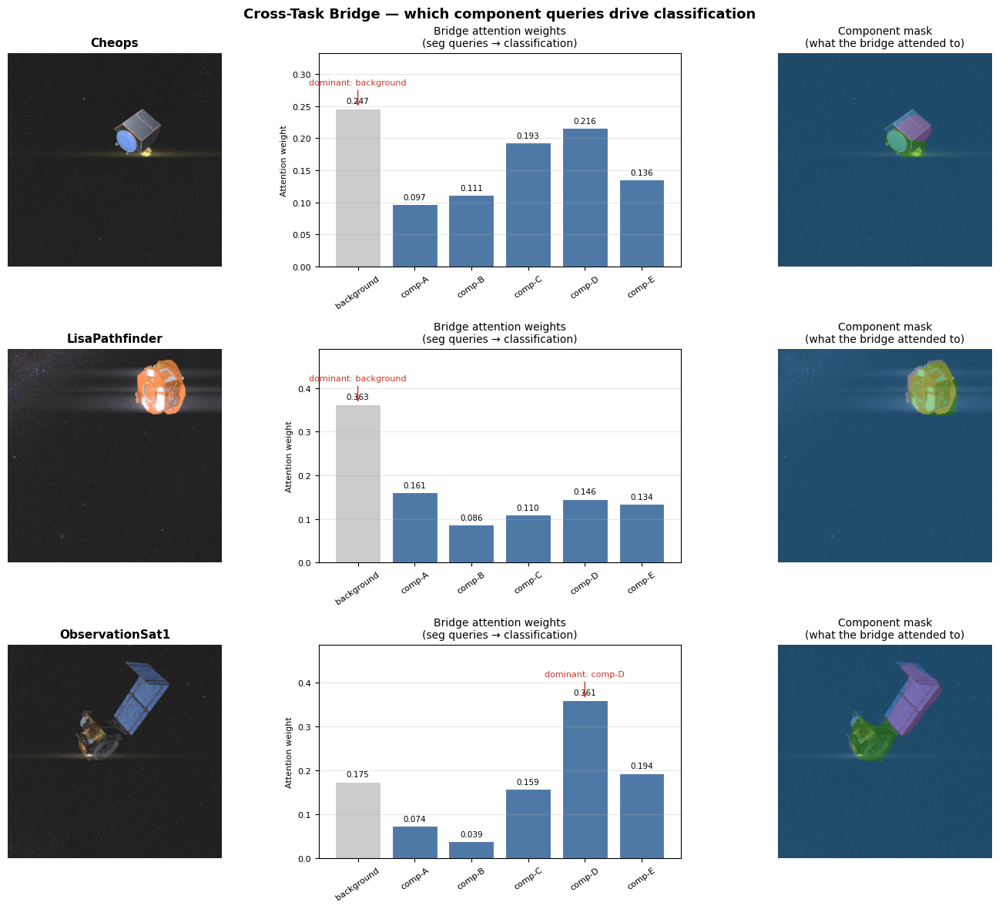

Saved → bridge_attention_weights.png


In [ ]:
#50
SEG_NAMES = ['background', 'comp-A', 'comp-B', 'comp-C', 'comp-D', 'comp-E']

# ── collect 3 correctly classified samples from different classes ─────────────
val_ds     = SparkDataset('DATA/val.csv', split='val')
val_loader = DataLoader(val_ds, batch_size=8, shuffle=False, num_workers=0)

samples, seen = [], set()
with torch.no_grad():
    for images, masks_gt, bboxes_gt, labels in val_loader:
        for i in range(images.size(0)):
            cls_idx = labels[i].item()
            if cls_idx in seen or len(samples) == 3:
                continue
            out  = model(images[i].unsqueeze(0))
            pred = out['cls_logits'].argmax(dim=1)[0].item()
            if pred == cls_idx:
                samples.append({
                    'image':  images[i],
                    'label':  cls_idx,
                    'out':    out,
                })
                seen.add(cls_idx)
        if len(samples) == 3:
            break

print(f"Collected: {[INV_CLASS_MAP[s['label']] for s in samples]}")

# ── figure: 3 rows × 3 cols ───────────────────────────────────────────────────
fig, axes = plt.subplots(3, 3, figsize=(15, 12))
fig.suptitle('Cross-Task Bridge — which component queries drive classification',
             fontsize=13, fontweight='bold')

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406])
IMAGENET_STD  = np.array([0.229, 0.224, 0.225])

for row, s in enumerate(samples):
    cls_name = INV_CLASS_MAP[s['label']]
    out      = s['out']

    img_np = (s['image'].permute(1,2,0).numpy()
              * IMAGENET_STD + IMAGENET_MEAN).clip(0, 1)

    # ── Panel 1: input image ──────────────────────────────────────────────
    axes[row, 0].imshow(img_np)
    axes[row, 0].set_title(f'{cls_name}', fontweight='bold', fontsize=11)
    axes[row, 0].axis('off')

    # ── Panel 2: bridge attention weights bar chart ───────────────────────
    weights = out['bridge_weights'][0, 0].numpy()       # [6]
    colors  = ['#cccccc'] + ['#4e79a7'] * 5             # bg=grey, components=blue
    bars    = axes[row, 1].bar(SEG_NAMES, weights,
                               color=colors, edgecolor='white', linewidth=0.8)
    axes[row, 1].set_title('Bridge attention weights\n(seg queries → classification)',
                            fontsize=10)
    axes[row, 1].set_ylim(0, max(weights.max() * 1.35, 0.01))
    axes[row, 1].tick_params(axis='x', rotation=35, labelsize=8)
    axes[row, 1].tick_params(axis='y', labelsize=8)
    axes[row, 1].set_ylabel('Attention weight', fontsize=8)
    axes[row, 1].grid(axis='y', alpha=0.3)
    for bar, w in zip(bars, weights):
        axes[row, 1].text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + weights.max() * 0.02,
            f'{w:.3f}', ha='center', va='bottom', fontsize=7.5
        )

    # ── Panel 3: segmentation overlay (what the bridge was reading) ───────
    mask_up   = F.interpolate(out['mask_logits'],
                              size=(IMG_SIZE, IMG_SIZE),
                              mode='bilinear', align_corners=False)
    pred_mask = mask_up.argmax(dim=1)[0].numpy()

    axes[row, 2].imshow(img_np)
    axes[row, 2].imshow(pred_mask, alpha=0.5, cmap='tab10', vmin=0, vmax=5)
    axes[row, 2].set_title('Component mask\n(what the bridge attended to)',
                            fontsize=10)
    axes[row, 2].axis('off')

    # annotate dominant query on panel 2
    dom_idx  = int(weights.argmax())
    dom_name = SEG_NAMES[dom_idx]
    axes[row, 1].annotate(
        f'dominant: {dom_name}',
        xy=(dom_idx, weights[dom_idx]),
        xytext=(dom_idx, weights[dom_idx] + weights.max() * 0.15),
        ha='center', fontsize=8, color='#c0392b',
        arrowprops=dict(arrowstyle='->', color='#c0392b', lw=1.0)
    )

plt.tight_layout()
plt.savefig('bridge_attention_weights.png', dpi=150, bbox_inches='tight')
plt.show()
print("Saved → bridge_attention_weights.png")